# **Valorisation des entreprises Partie IV**

Ce notebook est la suite du notebook `Valorisation_Entreprise_Data_Finpack_Parie_3`

### **Packages**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score, davies_bouldin_score, accuracy_score, classification_report, confusion_matrix, f1_score, log_loss 
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression 
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import RobustScaler
import pickle
import graphviz
import plotly.express as px
from tqdm import tqdm
import time
import copy

### **Data d'input**

In [2]:
#Importation les parties de description coder 
description_0_5000_coder = pd.read_excel ( 'Data Finpack V2/description_0_5000_coder.xlsx', index_col = 0 )

In [3]:
description_5000_10000_coder = pd.read_excel ( 'Data Finpack V2/description_5000_10000_coder.xlsx', index_col = 0 )

In [4]:
description_10000_15000_coder = pd.read_excel ( 'Data Finpack V2/description_10000_15000_coder.xlsx', index_col = 0 )

In [5]:
description_15000_17500_coder = pd.read_excel ( 'Data Finpack V2/description_15000_17500_coder.xlsx', index_col = 0 )

In [6]:
description_17500_21409_coder = pd.read_excel ( 'Data Finpack V2/description_17500_21409_coder.xlsx', index_col = 0 )

In [7]:
#Reconstruction de la df description
description_0_21409_coder = pd.concat( [description_0_5000_coder, description_5000_10000_coder, description_10000_15000_coder, description_15000_17500_coder, description_17500_21409_coder], axis = 0)
description_0_21409_coder

,business,products,services,summary,listed,stock,short,company's,production,engaged,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,1,1,0,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23,1,0,1,1,1,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
30,1,1,1,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
35,1,0,0,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
36,1,1,1,1,1,1,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,1,1,0,0,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
83681,1,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
83687,1,0,1,0,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
83690,1,0,0,1,1,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Réinitialisation de l'index de description_0_21729_coder
#description_0_21729_coder.reset_index(drop=True, inplace = True)

In [8]:
#Importation de data_normalzées
data_norm = pd.read_excel('Data Finpack V2/data_finpack_V2_sans_na_sans_out_norm.xlsx', index_col = 0)
data_norm = data_norm.drop ( ['Description'], axis = 1 )
data_norm

,Efcode,Company Name,Sector_Original,Country_Original,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,...,Days in acc. Pay. - Last,Days in Receiv. - Last,Sales To Receiv. - Last.1,EBITDA - Last,Total Assets - Last,Sharehold. Equity - Last,EBITDA Marg. (%) - Last,EBIT Marg. (%) - Last,ROE (%) - Last,ROCE (%) - Last
22,30031KN,11,Integrated Oil & Gas,NGA,0.517857,0.134328,-0.205479,1.682686,0.281579,1.882224,...,-0.164699,-0.551474,1.988124,0.732728,0.392183,0.213925,-0.275925,-0.184862,0.532646,0.512806
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.517857,0.835821,1.109589,-0.161432,-0.794737,0.568789,...,0.510024,-0.615530,1.861045,-0.120907,-0.181110,-0.194895,0.029715,-0.076419,-1.430241,0.213620
30,30268KN,Africa Prudential Plc,Investment Services,NGA,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.887504,...,-0.426269,1.438299,-0.288599,-0.165255,-0.124121,-0.120475,-0.701637,-0.747453,0.648110,-0.671129
35,30067KN,Aluminium Extrusion Industries PLC,Aluminum,NGA,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,0.287621,...,-0.535694,-0.790203,113.292162,-0.158457,-0.197514,-0.183297,-0.399030,-0.219796,-0.380069,-0.296275
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,0.517857,0.134328,7.794521,1.511816,-1.242105,1.611910,...,-0.130410,-0.546091,2.040380,-0.085894,0.394272,-0.121482,-0.620376,-0.556041,-4.599313,-0.699069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,0.571429,0.059701,-0.219178,0.088098,-0.047368,-0.717512,...,-0.290800,-0.507469,1.393112,0.629732,0.718787,1.486135,1.471195,1.701601,-0.245361,0.021537
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,0.571429,0.731343,0.643836,-0.066319,0.489474,1.489586,...,-0.684842,0.011977,0.709026,-0.058264,-0.172927,-0.163344,-0.151001,-0.251092,0.085223,0.346333
83687,30146AN,Neuren Pharmaceuticals Limited,Biotechnology,NZL,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-1.015694,...,-0.121417,-0.288925,0.289786,-0.186819,-0.154155,-0.095848,-1.249848,-1.197234,-0.450859,34.678696
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,0.571429,-0.223881,-0.630137,-0.040754,0.602632,-0.580375,...,-0.133408,-0.381779,0.686461,0.447747,0.153063,0.214946,2.214069,1.752547,0.403436,0.242724


In [9]:
#Concatination de data_Norm et description_0_21409_coder
data_V13 =  pd.concat ( [data_norm, description_0_21409_coder], axis = 1 )
data_V13

,Efcode,Company Name,Sector_Original,Country_Original,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,30031KN,11,Integrated Oil & Gas,NGA,0.517857,0.134328,-0.205479,1.682686,0.281579,1.882224,...,0,0,0,0,0,0,0,0,0,0
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.517857,0.835821,1.109589,-0.161432,-0.794737,0.568789,...,0,0,0,0,0,0,0,0,0,0
30,30268KN,Africa Prudential Plc,Investment Services,NGA,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.887504,...,0,0,0,0,0,0,0,0,0,0
35,30067KN,Aluminium Extrusion Industries PLC,Aluminum,NGA,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,0.287621,...,0,0,0,0,0,0,0,0,0,0
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,0.517857,0.134328,7.794521,1.511816,-1.242105,1.611910,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,0.571429,0.059701,-0.219178,0.088098,-0.047368,-0.717512,...,0,0,0,0,0,0,0,0,0,0
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,0.571429,0.731343,0.643836,-0.066319,0.489474,1.489586,...,0,0,0,0,0,0,0,0,0,0
83687,30146AN,Neuren Pharmaceuticals Limited,Biotechnology,NZL,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-1.015694,...,0,0,0,0,0,0,0,0,0,0
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,0.571429,-0.223881,-0.630137,-0.040754,0.602632,-0.580375,...,0,0,0,0,0,0,0,0,0,0


In [10]:
#Les colonnes company name, sector et country
company_sector_country = data_V13[[ 'Efcode', 'Company Name', 'Sector_Original', 'Country_Original',                           
                            'Sales To Assets (%) - Last', 'Fin. Debt / Equity (%) - 2020', 
                            'Fin. Debt / Assets (%) - 2020', 'Fin. Debt / Equity (%) - Last', 
                            'Fin. Debt / Assets (%) - Last', 'Goodwill / Equity (%) - Last', 
                            'Fin. Debt / Assets (%) - 2020.1',  'Fin. Debt / Assets (%) - Last.1' ]]
company_sector_country

,Efcode,Company Name,Sector_Original,Country_Original,Sales To Assets (%) - Last,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,Fin. Debt / Equity (%) - Last,Fin. Debt / Assets (%) - Last,Goodwill / Equity (%) - Last,Fin. Debt / Assets (%) - 2020.1,Fin. Debt / Assets (%) - Last.1
22,30031KN,11,Integrated Oil & Gas,NGA,1.882224,-0.189658,-0.337131,0.074830,-0.155179,0.000000,-0.343089,-0.168064
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.568789,0.616130,-0.059452,1.405206,0.214154,0.000000,-0.068054,0.197229
30,30268KN,Africa Prudential Plc,Investment Services,NGA,-0.887504,-0.385926,-0.539694,-0.410382,-0.573903,0.000000,-0.543724,-0.582209
35,30067KN,Aluminium Extrusion Industries PLC,Aluminum,NGA,0.287621,-0.385926,-0.539694,-0.345608,-0.441578,0.000000,-0.543724,-0.451331
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,1.611910,0.344204,-0.048060,8.381692,0.938076,0.000000,-0.056770,0.913234
...,...,...,...,...,...,...,...,...,...,...,...,...
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,-0.717512,0.359483,0.519402,0.391896,0.539255,37.227273,-0.543724,-0.582209
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,1.489586,0.671221,0.630117,0.668737,0.632142,0.000000,-0.543724,-0.582209
83687,30146AN,Neuren Pharmaceuticals Limited,Biotechnology,NZL,-1.015694,-0.277508,-0.337487,-0.347087,-0.461113,0.000000,0.056065,0.131608
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,-0.580375,1.134420,1.117124,0.834812,0.948028,0.659091,-0.016925,-0.086766


In [11]:
#Nous allons supprimées les colonnes dont on a pas besoin
data_V14 = data_V13.drop ( ['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 
                            'Sales To Assets (%) - Last', 'Fin. Debt / Equity (%) - 2020', 
                            'Fin. Debt / Assets (%) - 2020', 'Fin. Debt / Equity (%) - Last', 
                            'Fin. Debt / Assets (%) - Last', 'Goodwill / Equity (%) - Last', 
                            'Fin. Debt / Assets (%) - 2020.1',  'Fin. Debt / Assets (%) - Last.1'], axis = 1 )
data_V14

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Net Debt / EBITDA (x) - Last,Sales To Assets (%) - Last.1,Current Ratio (%) - Last,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,0.517857,0.134328,-0.205479,1.682686,0.281579,1.995198,-0.200000,-0.153846,1.887803,-0.366043,...,0,0,0,0,0,0,0,0,0,0
23,0.517857,0.835821,1.109589,-0.161432,-0.794737,1.866747,1.171429,0.218362,0.601350,-0.633416,...,0,0,0,0,0,0,0,0,0,0
30,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.306122,-0.214286,-0.776675,-0.825025,0.317370,...,0,0,0,0,0,0,0,0,0,0
35,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,114.501801,-0.028571,0.069479,0.325959,0.447747,...,0,0,0,0,0,0,0,0,0,0
36,0.517857,0.134328,7.794521,1.511816,-1.242105,2.048019,8.142857,8.985112,1.623043,-0.475543,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,0.571429,0.059701,-0.219178,0.088098,-0.047368,1.567827,0.185714,0.196030,0.793420,0.184826,...,0,0,0,0,0,0,0,0,0,0
83681,0.571429,0.731343,0.643836,-0.066319,0.489474,24.231693,0.528571,0.436725,-0.400948,1.764755,...,0,0,0,0,0,0,0,0,0,0
83687,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-0.762305,-0.457143,0.230769,-0.354547,-0.710607,...,0,0,0,0,0,0,0,0,0,0
83690,0.571429,-0.223881,-0.630137,-0.040754,0.602632,1.327731,1.085714,2.578164,-0.790260,3.275976,...,0,0,0,0,0,0,0,0,0,0


In [12]:
#Supprimons quelque variables pour libérer la mémoire 
del description_0_5000_coder
del description_5000_10000_coder
del description_10000_15000_coder
del description_15000_17500_coder
del description_17500_21409_coder
del data_V13
del data_V14

In [12]:
#Les colonnnes principales tu auras besoin dans l'extraction des classes
colonnes_principales = data_norm.columns
colonnes_principales = colonnes_principales.to_list ()
colonnes_principales.append ( 'labels' )
colonnes_principales

['Efcode',
 'Company Name',
 'Sector_Original',
 'Country_Original',
 'Country',
 'Sector',
 'Net Debt / Equity (x) - Last',
 'Net Sales - Last',
 'ROA - Last',
 'Sales To Assets (%) - Last',
 'Sales To Receiv. - Last',
 'Net Debt / Equity (x) - Last.1',
 'Fin. Debt / Equity (%) - 2020',
 'Fin. Debt / Assets (%) - 2020',
 'Fin. Debt / Equity (%) - Last',
 'Fin. Debt / Assets (%) - Last',
 'Net Debt / EBITDA (x) - Last',
 'Goodwill / Equity (%) - Last',
 'Fin. Debt / Assets (%) - 2020.1',
 'Sales To Assets (%) - Last.1',
 'Fin. Debt / Assets (%) - Last.1',
 'Current Ratio (%) - Last',
 'Days in Inventory - Last',
 'Days in acc. Pay. - Last',
 'Days in Receiv. - Last',
 'Sales To Receiv. - Last.1',
 'EBITDA - Last',
 'Total Assets - Last',
 'Sharehold. Equity - Last',
 'EBITDA Marg. (%) - Last',
 'EBIT Marg. (%) - Last',
 'ROE (%) - Last',
 'ROCE (%) - Last',
 'labels']

In [13]:
data_norm['Country'].value_counts()

-0.392857    5585
 0.142857    2902
 0.000000    1894
 1.142857     902
 0.214286     854
             ... 
-0.339286       1
-0.553571       1
-0.571429       1
 1.017857       1
-0.464286       1
Name: Country, Length: 105, dtype: int64

In [14]:
colonnes_clustering = ['Sector', 'Country', 'EBITDA - Last', 'EBITDA Marg. (%) - Last'] + description_0_21409_coder.columns.to_list()
colonnes_clustering

['Sector',
 'Country',
 'EBITDA - Last',
 'EBITDA Marg. (%) - Last',
 'business',
 'products',
 'services',
 'summary',
 'listed',
 'stock',
 'short',
 "company's",
 'production',
 'engaged',
 'limited',
 'development',
 'provides',
 'founded',
 'based',
 'taiwan',
 'offers',
 'established',
 'operates',
 'management',
 'exchange',
 'group',
 'equipment',
 'capital',
 'industrial',
 'public',
 'new',
 'shares',
 'construction',
 'market',
 'technology',
 'manufacture',
 'main',
 'tokyo',
 'systems',
 'investment',
 'power',
 'including',
 'incorporated',
 'manufacturing',
 'distribution',
 'companies',
 'solutions',
 'pt',
 'headquartered',
 'sales',
 'activities',
 'include',
 'mainly',
 'bombay',
 'changed',
 'llc',
 'industry',
 'wvb',
 'related',
 'real',
 'summarythe',
 'plant',
 'service',
 'sells',
 'high',
 'delaware',
 'engages',
 'sale',
 'million',
 'design',
 'subsidiary',
 'estate',
 'berhad',
 'india.wvb',
 'international',
 'china',
 'holding',
 'activity',
 'ab',
 'appo

### **Clustering sur data**

##### Iteration 1 (Dans cette patie nous avons supprimé les outliers)

In [15]:
#########################################################################################################
X = data_V14                                                                                            #
X                                                                                                       #
#########################################################################################################

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Net Debt / EBITDA (x) - Last,Sales To Assets (%) - Last.1,Current Ratio (%) - Last,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,0.517857,0.134328,-0.205479,1.682686,0.281579,1.995198,-0.200000,-0.153846,1.887803,-0.366043,...,0,0,0,0,0,0,0,0,0,0
23,0.517857,0.835821,1.109589,-0.161432,-0.794737,1.866747,1.171429,0.218362,0.601350,-0.633416,...,0,0,0,0,0,0,0,0,0,0
30,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.306122,-0.214286,-0.776675,-0.825025,0.317370,...,0,0,0,0,0,0,0,0,0,0
35,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,114.501801,-0.028571,0.069479,0.325959,0.447747,...,0,0,0,0,0,0,0,0,0,0
36,0.517857,0.134328,7.794521,1.511816,-1.242105,2.048019,8.142857,8.985112,1.623043,-0.475543,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,0.571429,0.059701,-0.219178,0.088098,-0.047368,1.567827,0.185714,0.196030,0.793420,0.184826,...,0,0,0,0,0,0,0,0,0,0
83681,0.571429,0.731343,0.643836,-0.066319,0.489474,24.231693,0.528571,0.436725,-0.400948,1.764755,...,0,0,0,0,0,0,0,0,0,0
83687,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-0.762305,-0.457143,0.230769,-0.354547,-0.710607,...,0,0,0,0,0,0,0,0,0,0
83690,0.571429,-0.223881,-0.630137,-0.040754,0.602632,1.327731,1.085714,2.578164,-0.790260,3.275976,...,0,0,0,0,0,0,0,0,0,0


In [36]:
correlations = data_V14.iloc [:, 0:21].corr()
px.imshow ( correlations, width = 1000, height = 900, title= 'Matrice des corrélations' )

In [16]:
#Application du PCA sur X pour réduire les dimension en deux colonnes 
pca = PCA(n_components = 2)
X_pca = pca.fit_transform( X )
X_pca = pd.DataFrame( X_pca, columns = ['X1','X2'], index = X.index )
X_pca

,X1,X2
22,2.805088,-3.395019
23,2.779374,-2.775738
30,0.858375,-4.026419
35,3.028968,-3.746661
36,2.798166,-3.437249
...,...,...
83676,2.772354,-3.582794
83681,2.232260,-3.883492
83687,2.546676,-3.499338
83690,2.554468,-3.444953


In [17]:
#Diagramme d'ELBOW et diagramme de la silhouette score 
inertia = []
silhouette = []
#davies_bouldin = []
models = {}
Nbr = [ i for i in range (2, 22) ]
for n in Nbr:
    models[n] = KMeans ( n_clusters = n, n_init = 13 )
    models[n].fit( X )
    inertia.append (models[n].inertia_)
    #silhouette.append ( silhouette_score( X, models[n].labels_ ) )
    #davies_bouldin.append ( davies_bouldin_score(X, model.labels_) )
    print ( 'Términé pour n_cluster :', n )

Términé pour n_cluster : 2
Términé pour n_cluster : 3
Términé pour n_cluster : 4
Términé pour n_cluster : 5
Términé pour n_cluster : 6


KeyboardInterrupt: 

In [ ]:
#Diagrmme d'elbow
fig5 = px.line( x = range (2, len( inertia )+2), y = inertia, width = 700, height =  500  )
fig5.show()

In [ ]:
#Diagramme silhouette
fig6 = px.line( x = range (2, len( silhouette )+2), y = silhouette, width = 700, height =  500  )
fig6.show()

In [44]:
#Initialisation du model 
n_clusters = 17
model_kmeans = KMeans ( n_clusters = n_clusters, n_init = 12 )
model_kmeans.fit( X )
model_kmeans_labels = model_kmeans.labels_
model_kmeans_labels = pd.DataFrame( model_kmeans_labels, columns = ["labels"], index = X.index )
model_kmeans_labels.value_counts()

labels
1         21192
0           146
9            16
12           13
14           12
16            6
10            4
5             3
3             3
13            3
6             2
11            2
2             2
15            2
7             1
4             1
8             1
dtype: int64

In [45]:
#X Lalbélisée
X_labels = pd.concat( [X, model_kmeans_labels], axis = 1 )
X_labels.head()

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Net Debt / EBITDA (x) - Last,Sales To Assets (%) - Last.1,Current Ratio (%) - Last,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
22,0.517857,0.134328,-0.205479,1.682686,0.281579,1.995198,-0.200000,-0.153846,1.887803,-0.366043,...,0,0,0,0,0,0,0,0,0,1
23,0.517857,0.835821,1.109589,-0.161432,-0.794737,1.866747,1.171429,0.218362,0.601350,-0.633416,...,0,0,0,0,0,0,0,0,0,1
30,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.306122,-0.214286,-0.776675,-0.825025,0.317370,...,0,0,0,0,0,0,0,0,0,1
35,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,114.501801,-0.028571,0.069479,0.325959,0.447747,...,0,0,0,0,0,0,0,0,0,1
36,0.517857,0.134328,7.794521,1.511816,-1.242105,2.048019,8.142857,8.985112,1.623043,-0.475543,...,0,0,0,0,0,0,0,0,0,1


In [20]:
#Clacule de la silhouette score et l'indice de davies bouldin
print ( 'Silhouette score du model KMeans pour n_clusters = :', n_clusters , ' est :' , silhouette_score(X, model_kmeans.labels_) )
print ( '''L'indice  de Davies Bouldin du model KMeans pour n_clusters=''', n_clusters, 'est ', davies_bouldin_score(X, model_kmeans.labels_))
#print ('Inertia du model KMeans n_clusters = :', n_clusters , ' est :', model_kmeans.inertia_)

Silhouette score du model KMeans pour n_clusters = : 17  est : 0.8340346710159939
L'indice  de Davies Bouldin du model KMeans pour n_clusters= 17 est  0.5475117129281781


In [46]:
#Jointure de X_pca et les label
X_pca_labels = pd.concat( [X_pca, model_kmeans_labels], axis = 1 )
X_pca_labels

,X1,X2,labels
22,2.805088,-3.395019,1
23,2.779374,-2.775738,1
30,0.858375,-4.026419,1
35,3.028968,-3.746661,1
36,2.798166,-3.437249,1
...,...,...,...
83676,2.772354,-3.582794,1
83681,2.232260,-3.883492,1
83687,2.546676,-3.499338,1
83690,2.554468,-3.444953,1


In [71]:
#visualisation des clusters avec pca
fig7 = px.scatter( X_pca_labels, x = 'X1', y= 'X2', color = 'labels', width = 800, height = 500 )
fig7.show()

Les classes 2 13 3 1 12 sont des outliers nous allons les éleminés de la data.

In [ ]:
#Elélmination des outliers
classe2 = X_labels[ X_labels.labels == 2 ]
classe3 = X_labels[ X_labels.labels == 3 ]
classe13 = X_labels[ X_labels.labels == 13 ]
classe1 = X_labels[ X_labels.labels == 1 ]
classe12 = X_labels[ X_labels.labels == 12 ]

#Mettant les classes dans une data frame
outliers_1 = pd.concat ( [classe1, classe2, classe3, classe12, classe13], axis = 0 )
#Ajoutons les colonnes company name, sector et coutry original
outliers_1 = pd.merge ( company_sector_country, outliers_1, right_index = True, left_index = True )
outliers_1

,Efcode,Company Name,Sector_Original,Country_Original,Sales To Assets (%) - Last,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,Fin. Debt / Equity (%) - Last,Fin. Debt / Assets (%) - Last,Goodwill / Equity (%) - Last,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
4143,40918OR,Gazprom Spetsgazavtotrans PJSC,Heavy Construction,RUS,-0.948519,0.105773,0.226415,-0.003549,0.089569,3.931818,...,0,0,0,0,0,0,0,0,0,12
10201,31494FC,"Hotron Precision Electronic Industrial Co., Ltd.",Electrical Components & Equipment,TWN,-0.106336,0.416483,0.240299,0.462289,0.294508,1.000000,...,0,0,0,0,0,0,0,0,0,12
11995,40007FT,Panjawattana Plastic PCL,Containers & Packaging,THA,0.558375,0.525048,0.576006,0.740461,0.714338,12.568182,...,0,0,0,0,0,0,0,0,0,12
14531,32992EX,Echo Energy plc,Exploration & Production,GBR,0.147844,1.044072,0.568174,0.578675,0.136380,9.431818,...,0,0,0,0,0,0,0,0,0,12
15018,32212EX,Jubilee Metals Group PLC,Platinum & Precious Metals,GBR,-0.316368,1.267225,0.628337,0.586513,0.273498,8.568182,...,0,0,0,0,0,0,0,0,0,12
16315,91029EX,4imprint Group plc,Media Agencies,GBR,5.944412,1.433524,0.647205,1.041408,0.573166,19.750000,...,0,0,0,0,0,0,0,0,0,12
16592,35110NU,ConocoPhillips,Integrated Oil & Gas,USA,0.211352,0.104598,0.118192,-0.195061,-0.239956,4.159091,...,1,0,0,0,0,0,0,0,0,12
16660,67455NU,Exterran Corp.,Oil Equipment & Services,USA,-0.231740,1.964595,1.385190,1.910529,1.109842,5.522727,...,0,0,0,0,0,0,0,0,0,12
16675,62416NU,Forum Energy Technologies Inc.,Oil Equipment & Services,USA,0.214139,0.220802,0.185475,-0.108548,-0.161076,0.000000,...,0,0,0,0,0,0,0,0,0,12
17015,50720NU,"Western Midstream Operating, LP",Exploration & Production,USA,-0.592402,0.711767,0.469562,0.265158,0.129377,0.977273,...,0,0,0,0,0,0,0,0,0,12


In [ ]:
#Extraction des outliers
#outliers_1[colonnes_principales].to_excel ( 'Data Finpack V2/Clusters V2/outliers.xlsx' )

In [ ]:
#Extraction des autres classes
X_labels_sans_out = X_labels.drop ( outliers_1.index.to_list(), axis = 0 )
#Ajoutons les colonnes company name, sector et coutry original
data_sans_outliers = pd.merge ( company_sector_country, X_labels_sans_out, right_index = True, left_index = True )
data_sans_outliers


,Efcode,Company Name,Sector_Original,Country_Original,Sales To Assets (%) - Last,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,Fin. Debt / Equity (%) - Last,Fin. Debt / Assets (%) - Last,Goodwill / Equity (%) - Last,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
22,30031KN,11,Integrated Oil & Gas,NGA,1.882224,-0.189658,-0.337131,0.074830,-0.155179,0.000000,...,0,0,0,0,0,0,0,0,0,0
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.568789,0.616130,-0.059452,1.405206,0.214154,0.000000,...,0,0,0,0,0,0,0,0,0,0
30,30268KN,Africa Prudential Plc,Investment Services,NGA,-0.887504,-0.385926,-0.539694,-0.410382,-0.573903,0.000000,...,0,0,0,0,0,0,0,0,0,0
35,30067KN,Aluminium Extrusion Industries PLC,Aluminum,NGA,0.287621,-0.385926,-0.539694,-0.345608,-0.441578,0.000000,...,0,0,0,0,0,0,0,0,0,0
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,1.611910,0.344204,-0.048060,8.381692,0.938076,0.000000,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,-0.717512,0.359483,0.519402,0.391896,0.539255,37.227273,...,0,0,0,0,0,0,0,0,0,0
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,1.489586,0.671221,0.630117,0.668737,0.632142,0.000000,...,0,0,0,0,0,0,0,0,0,0
83687,30146AN,Neuren Pharmaceuticals Limited,Biotechnology,NZL,-1.015694,-0.277508,-0.337487,-0.347087,-0.461113,0.000000,...,0,0,0,0,0,0,0,0,0,0
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,-0.580375,1.134420,1.117124,0.834812,0.948028,0.659091,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Extraction 
data_sans_outliers[colonnes_principales].to_excel ( 'Data Finpack V2/Clusters V2/data_sans_outliers.xlsx' )

##### Iteration 2 (Extraction de classe 6, 1, 13 et classe 0 a cluster et 14 a cluster et outliers 3)

In [73]:
data = pd.read_excel ( 'Data Finpack V2/Clusters V2/data_sans_outliers.xlsx', index_col = 0 )
data  = data.drop( company_sector_country, axis = 1 )
data = pd.merge ( data, description_0_21409_coder, right_index = True, left_index = True )
data

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Net Debt / EBITDA (x) - Last,Sales To Assets (%) - Last.1,Current Ratio (%) - Last,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,0.517857,0.134328,-0.205479,1.682686,0.281579,1.995198,-0.200000,-0.153846,1.887803,-0.366043,...,0,0,0,0,0,0,0,0,0,0
23,0.517857,0.835821,1.109589,-0.161432,-0.794737,1.866747,1.171429,0.218362,0.601350,-0.633416,...,0,0,0,0,0,0,0,0,0,0
30,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.306122,-0.214286,-0.776675,-0.825025,0.317370,...,0,0,0,0,0,0,0,0,0,0
35,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,114.501801,-0.028571,0.069479,0.325959,0.447747,...,0,0,0,0,0,0,0,0,0,0
36,0.517857,0.134328,7.794521,1.511816,-1.242105,2.048019,8.142857,8.985112,1.623043,-0.475543,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,0.571429,0.059701,-0.219178,0.088098,-0.047368,1.567827,0.185714,0.196030,0.793420,0.184826,...,0,0,0,0,0,0,0,0,0,0
83681,0.571429,0.731343,0.643836,-0.066319,0.489474,24.231693,0.528571,0.436725,-0.400948,1.764755,...,0,0,0,0,0,0,0,0,0,0
83687,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-0.762305,-0.457143,0.230769,-0.354547,-0.710607,...,0,0,0,0,0,0,0,0,0,0
83690,0.571429,-0.223881,-0.630137,-0.040754,0.602632,1.327731,1.085714,2.578164,-0.790260,3.275976,...,0,0,0,0,0,0,0,0,0,0


In [74]:
#########################################################################################################
X = data[ colonnes_clustering ]                                                                                      #
X                                                                                                       #
#########################################################################################################

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,0.134328,0.517857,0.732728,-0.275925,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
23,0.835821,0.517857,-0.120907,0.029715,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
30,0.164179,0.517857,-0.165255,-0.701637,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
35,-0.761194,0.517857,-0.158457,-0.399030,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
36,0.134328,0.517857,-0.085894,-0.620376,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,0.059701,0.571429,0.629732,1.471195,1,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
83681,0.731343,0.571429,-0.058264,-0.151001,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
83687,-0.671642,0.571429,-0.186819,-1.249848,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
83690,-0.223881,0.571429,0.447747,2.214069,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [75]:
#Application du PCA sur X pour réduire les dimension en deux colonnes 
pca = PCA(n_components = 2)
X_pca = pca.fit_transform( X )
X_pca = pd.DataFrame( X_pca, columns = ['X1','X2'], index = X.index )
X_pca

,X1,X2
22,-4.464689,-0.238320
23,-5.320225,-0.174118
30,-5.361772,-0.771206
35,-5.360653,-0.687297
36,-5.281042,-0.771230
...,...,...
83676,-4.564848,1.534747
83681,-5.255791,-0.220325
83687,-5.387422,-1.422031
83690,-4.744854,2.233501


In [76]:
#Diagramme d'ELBOW et diagramme de la silhouette score 
inertia = []
silhouette = []
#davies_bouldin = []
models = {}
Nbr = [ i for i in range (15, 20) ]
for n in Nbr:
    models[n] = KMeans ( n_clusters = n, n_init = 13 )
    models[n].fit( X )
    inertia.append (models[n].inertia_)
    silhouette.append ( silhouette_score( X, models[n].labels_ ) )
    #davies_bouldin.append ( davies_bouldin_score(X, model.labels_) )
    print ( 'Términé pour n_cluster :', n )

KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 180, in where
  File "c:\Users\hh\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\multiarray.py", line 345, in where
    @array_function_from_c_func_and_dispatcher(_multiarray_umath.where)
KeyboardInterrupt: 


KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 180, in where
  File "c:\Users\hh\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\multiarray.py", line 345, in where
    @array_function_from_c_func_and_dispatcher(_multiarray_umath.where)
KeyboardInterrupt: 


Términé pour n_cluster : 15


KeyboardInterrupt: 

In [48]:
#Diagrmme d'elbow
fig5 = px.line( x = range (2, len( inertia )+2), y = inertia, width = 700, height =  500  )
fig5.show()

In [49]:
#Diagramme silhouette
fig6 = px.line( x = range (2, len( silhouette )+2), y = silhouette, width = 700, height =  500  )
fig6.show()

In [81]:
#Initialisation du model 
n_clusters = 5
model_kmeans = KMeans ( n_clusters = n_clusters, n_init = 12 )
model_kmeans.fit( X )
model_kmeans_labels = model_kmeans.labels_
model_kmeans_labels = pd.DataFrame( model_kmeans_labels, columns = ["labels"], index = X.index )
model_kmeans_labels.value_counts()

labels
0         21087
4           257
2            39
3            11
1             1
dtype: int64

In [82]:
#X Lalbélisée
X_labels = pd.concat( [X, model_kmeans_labels], axis = 1 )
X_labels.head()

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
22,0.134328,0.517857,0.732728,-0.275925,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
23,0.835821,0.517857,-0.120907,0.029715,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
30,0.164179,0.517857,-0.165255,-0.701637,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
35,-0.761194,0.517857,-0.158457,-0.399030,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
36,0.134328,0.517857,-0.085894,-0.620376,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [73]:
#Clacule de la silhouette score et l'indice de davies bouldin
print ( 'Silhouette score du model KMeans pour n_clusters = :', n_clusters , ' est :' , silhouette_score(X, model_kmeans.labels_) )
print ( '''L'indice  de Davies Bouldin du model KMeans pour n_clusters=''', n_clusters, 'est ', davies_bouldin_score(X, model_kmeans.labels_))
#print ('Inertia du model KMeans n_clusters = :', n_clusters , ' est :', model_kmeans.inertia_)

Silhouette score du model KMeans pour n_clusters = : 16  est : 0.037487432303189044
L'indice  de Davies Bouldin du model KMeans pour n_clusters= 16 est  1.1637992735442513


In [83]:
#Jointure de X_pca et les label
X_pca_labels = pd.concat( [X_pca, model_kmeans_labels], axis = 1 )
X_pca_labels

,X1,X2,labels
22,-4.464689,-0.238320,0
23,-5.320225,-0.174118,0
30,-5.361772,-0.771206,0
35,-5.360653,-0.687297,0
36,-5.281042,-0.771230,0
...,...,...,...
83676,-4.564848,1.534747,0
83681,-5.255791,-0.220325,0
83687,-5.387422,-1.422031,0
83690,-4.744854,2.233501,0


In [89]:
#visualisation des clusters avec pca
fig2 = px.scatter( X_pca, x = 'X1', y= 'X2', color = X_labels.labels, width = 700, height = 500 )
fig2.update_layout(legend_title_text='Cluster')  # Remplacez 'Étiquettes' par le titre souhaité
fig2.show()

In [76]:
#visualisation des clusters avec pca
fig6 = px.scatter( X_labels, x = 'Sector', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig6.show()

In [83]:
#visualisation des clusters avec pca
fig7 = px.scatter( X_labels, x = 'Sector', y= 'EBITDA Marg. (%) - Last',  color = 'labels' , width = 700, height = 500 )
fig7.show()

In [89]:
#Elélmination des outliers
classe1 = X_labels[ X_labels.labels == 1 ]
classe10 = X_labels[ X_labels.labels == 10 ]
classe2 = X_labels[ X_labels.labels == 2 ]
classe4 = X_labels[ X_labels.labels == 4 ]


#Mettant les classes dans une data frame
outliers_3 = pd.concat ( [classe1, classe2, classe4, classe10], axis = 0 )
#Ajoutons les colonnes company name, sector et coutry original
outliers_3 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], outliers_3, right_index = True, left_index = True )
outliers_3

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
4142,30005OR,Gazprom PJSC,Integrated Oil & Gas,RUS,0.134328,0.785714,1434.119598,1.565191,1,1,...,0,0,0,0,0,0,0,0,0,4
5514,30947GS,Saudi Arabian Oil Co. (Saudi Aramco),Integrated Oil & Gas,SAU,0.134328,0.803571,8132.474707,2.656762,1,1,...,1,0,0,0,0,0,0,0,0,1
14518,01571EX,BP p.l.c.,Integrated Oil & Gas,GBR,0.134328,-0.125000,1444.005706,0.810188,1,1,...,0,0,0,0,0,0,0,0,0,4
14586,91208EN,Shell Plc,Integrated Oil & Gas,GBR,0.134328,-0.125000,2116.046778,0.704063,1,1,...,0,0,0,0,0,0,0,0,0,2
16662,30238NU,Exxon Mobil Corporation,Integrated Oil & Gas,USA,0.134328,1.089286,2535.803626,0.902971,1,1,...,0,0,0,0,0,1,0,0,0,10
27111,31195NU,Amazon.com Inc.,Broadline Retailers,USA,-0.626866,1.089286,1338.850201,-0.018193,1,1,...,0,0,0,0,0,0,0,0,0,4
61840,02501ED,Volkswagen AG,Automobiles,DEU,-0.701493,-0.267857,1394.251925,0.487568,1,1,...,0,0,0,0,0,0,0,0,0,4
78608,30005FK,"Samsung Electronics Co., Ltd.",Consumer Electronics,KOR,-0.477612,0.214286,1659.013129,1.047301,1,1,...,0,0,0,0,0,0,0,0,0,4


In [90]:
#Extraction des outliers
#outliers_3[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/outliers3.xlsx' )

In [93]:
#EXTRACTION DES CLASSES
classe1 = X_labels[ X_labels.labels.isin ([12, 7, 3, 11, 8, 5, 9, 15]) ]
classe6 = X_labels[ X_labels.labels == 6 ]
classe13 = X_labels[ X_labels.labels == 13 ]
classe14 = X_labels[ X_labels.labels == 14 ]
classe0 = X_labels[ X_labels.labels == 0 ]


classe1[ 'labels' ] = 1


#Ajoutons les colonnes company name, sector et coutry original
classe1 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe1, right_index = True, left_index = True )
classe6 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe6, right_index = True, left_index = True )
classe13 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe13, right_index = True, left_index = True )
classe14 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe14, right_index = True, left_index = True )
classe0 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe0, right_index = True, left_index = True )

classe0

C:\Users\hh\AppData\Local\Temp\ipykernel_30888\2220715594.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
22,30031KN,11,Integrated Oil & Gas,NGA,0.134328,0.517857,0.732728,-0.275925,1,1,...,0,0,0,0,0,0,0,0,0,0
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.835821,0.517857,-0.120907,0.029715,1,0,...,0,0,0,0,0,0,0,0,0,0
30,30268KN,Africa Prudential Plc,Investment Services,NGA,0.164179,0.517857,-0.165255,-0.701637,1,1,...,0,0,0,0,0,0,0,0,0,0
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,0.134328,0.517857,-0.085894,-0.620376,1,1,...,0,0,0,0,0,0,0,0,0,0
39,30156KN,BOC Gases Plc,Medical Equipment,NGA,0.238806,0.517857,-0.089054,0.933293,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83675,30066AN,Michael Hill International Ltd.,Apparel Retailers,NZL,-0.746269,0.571429,1.848846,0.657368,1,0,...,0,0,0,0,0,0,0,0,0,0
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,0.059701,0.571429,0.629732,1.471195,1,1,...,0,0,0,0,0,0,0,0,0,0
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,0.731343,0.571429,-0.058264,-0.151001,1,0,...,0,0,0,0,0,0,0,0,0,0
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,-0.223881,0.571429,0.447747,2.214069,1,0,...,0,0,0,0,0,0,0,0,0,0


In [95]:
#Extraction des classes
classe1[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe1.xlsx' )
classe6[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe6.xlsx' )
classe13[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe13.xlsx' )
classe14[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe14_a_clustrer.xlsx' )
classe0[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe0_a_clustrer.xlsx' )

##### Iteration 3 (Clustering sur classe 0 a clustrer)

In [16]:
data = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe0_a_clustrer.xlsx', index_col = 0 )
data = pd.merge ( data, description_0_21409_coder, right_index = True, left_index = True )
data

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels,business,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,30031KN,11,Integrated Oil & Gas,NGA,0.134328,0.517857,0.732728,-0.275925,0,1,...,0,0,0,0,0,0,0,0,0,0
23,30145KN,ABC Transport PLC,Travel & Tourism,NGA,0.835821,0.517857,-0.120907,0.029715,0,1,...,0,0,0,0,0,0,0,0,0,0
30,30268KN,Africa Prudential Plc,Investment Services,NGA,0.164179,0.517857,-0.165255,-0.701637,0,1,...,0,0,0,0,0,0,0,0,0,0
36,30033KN,Ardova Plc,Integrated Oil & Gas,NGA,0.134328,0.517857,-0.085894,-0.620376,0,1,...,0,0,0,0,0,0,0,0,0,0
39,30156KN,BOC Gases Plc,Medical Equipment,NGA,0.238806,0.517857,-0.089054,0.933293,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83675,30066AN,Michael Hill International Ltd.,Apparel Retailers,NZL,-0.746269,0.571429,1.848846,0.657368,0,1,...,0,0,0,0,0,0,0,0,0,0
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,0.059701,0.571429,0.629732,1.471195,0,1,...,0,0,0,0,0,0,0,0,0,0
83681,40127AN,NZ Automotive Investments Ltd.,Specialty Retailers,NZL,0.731343,0.571429,-0.058264,-0.151001,0,1,...,0,0,0,0,0,0,0,0,0,0
83690,30021AN,New Zealand Oil & Gas Limited,Exploration & Production,NZL,-0.223881,0.571429,0.447747,2.214069,0,1,...,0,0,0,0,0,0,0,0,0,0


In [17]:
#########################################################################################################
X = data [colonnes_clustering]                                                                                    #
X                                                                                                       #
#########################################################################################################

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
22,0.134328,0.517857,0.732728,-0.275925,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
23,0.835821,0.517857,-0.120907,0.029715,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
30,0.164179,0.517857,-0.165255,-0.701637,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
36,0.134328,0.517857,-0.085894,-0.620376,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
39,0.238806,0.517857,-0.089054,0.933293,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83675,-0.746269,0.571429,1.848846,0.657368,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
83676,0.059701,0.571429,0.629732,1.471195,1,1,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
83681,0.731343,0.571429,-0.058264,-0.151001,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
83690,-0.223881,0.571429,0.447747,2.214069,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [18]:
#Application du PCA sur X pour réduire les dimension en deux colonnes 
pca = PCA(n_components = 2)
X_pca = pca.fit_transform( X )
X_pca = pd.DataFrame( X_pca, columns = ['X1','X2'], index = X.index )
X_pca

,X1,X2
22,-0.095252,0.137027
23,0.009794,-0.643696
30,-1.174468,0.326988
36,-0.956624,-0.687070
39,0.216920,0.240532
...,...,...
83675,0.639601,0.544139
83676,1.449919,0.775812
83681,-0.090631,-0.356183
83690,2.085782,0.562338


In [19]:
#Diagramme d'ELBOW et diagramme de la silhouette score 
inertia = []
silhouette = []
#davies_bouldin = []
models = {}
Nbr = [ i for i in range (2, 12) ]
for n in Nbr:
    models[n] = KMeans ( n_clusters = n, n_init = 13 )
    models[n].fit( X )
    inertia.append (models[n].inertia_)
    silhouette.append ( silhouette_score( X, models[n].labels_ ) )
    #davies_bouldin.append ( davies_bouldin_score(X, model.labels_) )
    print ( 'Términé pour n_cluster :', n )

Términé pour n_cluster : 2
Términé pour n_cluster : 3
Términé pour n_cluster : 4
Términé pour n_cluster : 5
Términé pour n_cluster : 6
Términé pour n_cluster : 7
Términé pour n_cluster : 8
Términé pour n_cluster : 9
Términé pour n_cluster : 10
Términé pour n_cluster : 11


In [20]:
#Diagrmme d'elbow
fig5 = px.line( x = range (2, len( inertia )+2), y = inertia, width = 700, height =  500  )
fig5.show()

In [21]:
#Diagramme silhouette
fig6 = px.line( x = range (2, len( silhouette )+2), y = silhouette, width = 700, height =  500  )
fig6.show()

In [44]:
#Initialisation du model 
n_clusters = 7
model_kmeans = KMeans ( n_clusters = n_clusters, n_init = 12 )
model_kmeans.fit( X )
model_kmeans_labels = model_kmeans.labels_
model_kmeans_labels = pd.DataFrame( model_kmeans_labels, columns = ["labels"], index = X.index )
model_kmeans_labels.value_counts()

labels
4         4436
0         2197
2         1707
5         1223
6          990
3          974
1           51
dtype: int64

In [45]:
#X Lalbélisée
X_labels = pd.concat( [X, model_kmeans_labels], axis = 1 )
X_labels.head()

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
22,0.134328,0.517857,0.732728,-0.275925,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,4
23,0.835821,0.517857,-0.120907,0.029715,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,4
30,0.164179,0.517857,-0.165255,-0.701637,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,4
36,0.134328,0.517857,-0.085894,-0.620376,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,4
39,0.238806,0.517857,-0.089054,0.933293,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,4


In [46]:
#Clacule de la silhouette score et l'indice de davies bouldin
print ( 'Silhouette score du model KMeans pour n_clusters = :', n_clusters , ' est :' , silhouette_score(X, model_kmeans.labels_) )
print ( '''L'indice  de Davies Bouldin du model KMeans pour n_clusters=''', n_clusters, 'est ', davies_bouldin_score(X, model_kmeans.labels_))
#print ('Inertia du model KMeans n_clusters = :', n_clusters , ' est :', model_kmeans.inertia_)

Silhouette score du model KMeans pour n_clusters = : 7  est : -0.01639363371475492
L'indice  de Davies Bouldin du model KMeans pour n_clusters= 7 est  4.967307552660484


In [47]:
#Jointure de X_pca et les label
X_pca_labels = pd.concat( [X_pca, model_kmeans_labels], axis = 1 )
X_pca_labels

,X1,X2,labels
22,-0.095252,0.137027,4
23,0.009794,-0.643696,4
30,-1.174468,0.326988,4
36,-0.956624,-0.687070,4
39,0.216920,0.240532,4
...,...,...,...
83675,0.639601,0.544139,5
83676,1.449919,0.775812,6
83681,-0.090631,-0.356183,4
83690,2.085782,0.562338,6


In [48]:
#visualisation des clusters avec pca
fig5 = px.scatter( X_pca_labels, x = 'X1', y= 'X2', color = 'labels', width = 700, height = 500 )
fig5.show()

In [49]:
#visualisation des clusters avec pca
fig6 = px.scatter( X_labels, x = 'Sector', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig6.show()

In [50]:
#visualisation des clusters avec pca
fig7 = px.scatter( X_labels, x = 'Country', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig7.show()

In [52]:
#visualisation des clusters avec pca
fig8 = px.scatter( X_labels, x = 'digital', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig8.show()

In [55]:
#Extraction des classes 
classe1 = X_labels[ X_labels.labels == 1 ]
classe6 = X_labels[ X_labels.labels == 6 ]
classe4 = X_labels[ X_labels.labels == 4 ]
classe0 = X_labels[ X_labels.labels == 0 ]
classe2 = X_labels[ X_labels.labels == 2 ]
classe5 = X_labels[ X_labels.labels == 5 ]
classe3 = X_labels[ X_labels.labels == 3 ]


#Mettant les classes dans une data frame
classe7 = pd.concat ( [classe1, classe6], axis = 0 )
#Changement de label de classe 7 en 7
classe7.labels = 7
#Ajoutons les colonnes company name, sector et coutry original
classe7 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe7, right_index = True, left_index = True )
classe4 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe4, right_index = True, left_index = True )
classe0 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe0, right_index = True, left_index = True )
classe2 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe2, right_index = True, left_index = True )
classe5 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe5, right_index = True, left_index = True )
classe3 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe3, right_index = True, left_index = True )

classe7

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
141,30011KN,Presco PLC,Farming & Fishing,NGA,-0.208955,0.517857,1.951447,2.209218,1,1,...,0,0,0,0,0,0,0,0,0,7
202,40035SN,Aega ASA,Asset Managers,NOR,-0.731343,0.553571,-0.140406,1.435415,1,0,...,0,0,0,0,0,0,0,0,0,7
212,30276SN,American Shipping Company ASA,Marine Transportation,NOR,0.208955,0.553571,2.033996,5.101880,1,0,...,0,0,0,0,0,0,0,0,0,7
228,40034SN,Awilco LNG ASA,Marine Transportation,NOR,0.208955,0.553571,0.610639,3.032141,1,0,...,0,0,0,0,0,0,0,0,0,7
246,40353SN,CLOUDBERRY CLEAN ENERGY,Electricity,NOR,-0.283582,0.553571,0.216033,3.562765,1,0,...,0,0,0,0,0,0,0,0,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82771,40033OI,TESO INVESTMENT,Coal,MNG,-0.552239,0.446429,1.928275,1.896301,1,0,...,0,0,0,0,0,0,0,0,0,7
83590,40074AN,AUSTRALIAN FINANCIALS ETF,Equity Investment Instruments,NZL,-0.238806,0.571429,-0.145588,5.401455,1,0,...,0,0,0,0,0,0,0,0,0,7
83668,30112AN,Marsden Maritime Holdings Limited,Transportation Services,NZL,0.820896,0.571429,-0.002579,6.644027,1,0,...,0,0,0,0,0,0,0,0,0,7
83676,30029AN,Millennium & Copthorne Hotels New Zealand Limited,Hotels,NZL,0.059701,0.571429,0.629732,1.471195,1,1,...,0,0,0,0,0,0,0,0,0,7


In [61]:
#Extraction des outliers
classe7[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe7.xlsx' )
classe4[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe4.xlsx' )
classe0[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe0.xlsx' )
classe2[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe2.xlsx' )
classe5[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe5.xlsx' )
classe3[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe3.xlsx' )

##### Iteration 4 (Clustering sur classe 14 a clustrer)

In [55]:
data = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe14_a_clustrer.xlsx', index_col = 0 )
data = pd.merge ( data, description_0_21409_coder, right_index = True, left_index = True )
data

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels,business,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
35,30067KN,Aluminium Extrusion Industries PLC,Aluminum,NGA,-0.761194,0.517857,-0.158457,-0.399030,14,1,...,0,0,0,0,0,0,0,0,0,0
72,30064KN,Ekocorp PLC,Health Care Providers,NGA,-0.014925,0.517857,-0.175119,-1.690115,14,1,...,0,0,0,0,0,0,0,0,0,0
86,30287KN,GLOBAL SPECTRUM ENERGY SERVICE,Oil Equipment & Services,NGA,0.373134,0.517857,-0.143997,0.428745,14,1,...,1,0,0,0,0,0,0,0,0,0
108,30118KN,Learn Africa PLC,Publishing,NGA,0.477612,0.517857,-0.120194,0.588235,14,1,...,0,0,0,0,0,0,0,0,0,0
110,30085KN,Livestock Feeds PLC,Farming & Fishing,NGA,-0.208955,0.517857,-0.101205,-0.209824,14,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82876,4000300,PORT OF ADRIA,Speciality REITs,MNE,0.671642,0.428571,-0.096359,1.352335,14,1,...,0,0,0,0,0,0,0,0,0,0
82883,4004900,REPUBLICAN INSTITUTE FOR URBAN,Business Support Services,MNE,-0.597015,0.428571,-0.166473,-4.053366,14,1,...,0,0,0,0,0,0,0,0,0,0
83366,X0003EN,Cabka N.V.,Investment Services,NLD,0.164179,0.535714,-0.531932,-1.060643,14,1,...,0,0,0,0,0,0,0,0,0,0
83450,30390EN,La Perla Fashion Holding NV,Clothing & Accessories,NLD,-0.567164,0.535714,-1.268402,-3.986052,14,1,...,0,0,0,0,0,0,0,0,0,0


In [56]:
#########################################################################################################
X = data [colonnes_clustering]                                                                                    #
X                                                                                                       #
#########################################################################################################

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
35,-0.761194,0.517857,-0.158457,-0.399030,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
72,-0.014925,0.517857,-0.175119,-1.690115,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
86,0.373134,0.517857,-0.143997,0.428745,1,0,1,1,1,0,...,1,0,0,0,0,0,0,0,0,0
108,0.477612,0.517857,-0.120194,0.588235,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
110,-0.208955,0.517857,-0.101205,-0.209824,1,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82876,0.671642,0.428571,-0.096359,1.352335,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
82883,-0.597015,0.428571,-0.166473,-4.053366,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
83366,0.164179,0.535714,-0.531932,-1.060643,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
83450,-0.567164,0.535714,-1.268402,-3.986052,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [57]:
#Application du PCA sur X pour réduire les dimension en deux colonnes 
pca = PCA(n_components = 2)
X_pca = pca.fit_transform( X )
X_pca = pd.DataFrame( X_pca, columns = ['X1','X2'], index = X.index )
X_pca

,X1,X2
35,0.026926,-1.673811
72,0.187392,-1.914293
86,-0.039501,-1.114029
108,-0.062370,-0.502294
110,-0.015843,-1.633145
...,...,...
82876,-0.216898,-0.747437
82883,0.269123,-2.685231
83366,0.462246,-1.971566
83450,1.520163,-2.775575


In [65]:
#Diagramme d'ELBOW et diagramme de la silhouette score 
inertia = []
silhouette = []
#davies_bouldin = []
models = {}
Nbr = [ i for i in range (2, 10) ]
for n in Nbr:
    models[n] = KMeans ( n_clusters = n, n_init = 13 )
    models[n].fit( X )
    inertia.append (models[n].inertia_)
    silhouette.append ( silhouette_score( X, models[n].labels_ ) )
    #davies_bouldin.append ( davies_bouldin_score(X, model.labels_) )
    print ( 'Términé pour n_cluster :', n )

Términé pour n_cluster : 2
Términé pour n_cluster : 3
Términé pour n_cluster : 4
Términé pour n_cluster : 5
Términé pour n_cluster : 6
Términé pour n_cluster : 7
Términé pour n_cluster : 8
Términé pour n_cluster : 9


In [66]:
#Diagrmme d'elbow
fig5 = px.line( x = range (2, len( inertia )+2), y = inertia, width = 700, height =  500  )
fig5.show()

In [67]:
#Diagramme silhouette
fig6 = px.line( x = range (2, len( silhouette )+2), y = silhouette, width = 700, height =  500  )
fig6.show()

In [59]:
#Initialisation du model 8
n_clusters = 8
model_kmeans = KMeans ( n_clusters = n_clusters, n_init = 12 )
model_kmeans.fit( X )
model_kmeans_labels = model_kmeans.labels_
model_kmeans_labels = pd.DataFrame( model_kmeans_labels, columns = ["labels"], index = X.index )
model_kmeans_labels.value_counts()

labels
14        1011
9          850
12         837
0          749
8          713
3          682
11         565
13         532
7          485
10         430
5          306
4          248
6          183
1           13
2            4
dtype: int64

In [60]:
#X Lalbélisée
X_labels = pd.concat( [X, model_kmeans_labels], axis = 1 )
X_labels.head()

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,services,summary,listed,stock,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
35,-0.761194,0.517857,-0.158457,-0.399030,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,12
72,-0.014925,0.517857,-0.175119,-1.690115,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,13
86,0.373134,0.517857,-0.143997,0.428745,1,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,9
108,0.477612,0.517857,-0.120194,0.588235,1,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,13
110,-0.208955,0.517857,-0.101205,-0.209824,1,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,13


In [124]:
#Clacule de la silhouette score et l'indice de davies bouldin
print ( 'Silhouette score du model KMeans pour n_clusters = :', n_clusters , ' est :' , silhouette_score(X, model_kmeans.labels_) )
print ( '''L'indice  de Davies Bouldin du model KMeans pour n_clusters=''', n_clusters, 'est ', davies_bouldin_score(X, model_kmeans.labels_))
#print ('Inertia du model KMeans n_clusters = :', n_clusters , ' est :', model_kmeans.inertia_)

Silhouette score du model KMeans pour n_clusters = : 8  est : 0.01346616610151881
L'indice  de Davies Bouldin du model KMeans pour n_clusters= 8 est  3.0577149852105956


In [61]:
#Jointure de X_pca et les label
X_pca_labels = pd.concat( [X_pca, model_kmeans_labels], axis = 1 )
X_pca_labels

,X1,X2,labels
35,0.026926,-1.673811,12
72,0.187392,-1.914293,13
86,-0.039501,-1.114029,9
108,-0.062370,-0.502294,13
110,-0.015843,-1.633145,13
...,...,...,...
82876,-0.216898,-0.747437,4
82883,0.269123,-2.685231,7
83366,0.462246,-1.971566,9
83450,1.520163,-2.775575,7


In [63]:
#visualisation des clusters avec pca
fig5 = px.scatter( X_pca_labels, x = 'X1', y= 'X2', color = 'labels', width = 700, height = 500, title = '''Visualisation des clusters à l'aide du PCA''' )
fig5.show()

In [125]:
#visualisation des clusters avec pca
fig6 = px.scatter( X_labels, x = 'Sector', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig6.show()

In [126]:
#visualisation des clusters avec pca
fig7 = px.scatter( X_labels, x = 'Country', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig7.show()

In [127]:
#visualisation des clusters avec pca
fig8 = px.scatter( X_labels, x = 'digital', y= 'EBITDA - Last',  color = 'labels' , width = 700, height = 500 )
fig8.show()

In [131]:
#Extraction des classes 
classe0 = X_labels[ X_labels.labels == 0 ]
classe1 = X_labels[ X_labels.labels == 1 ]
classe2 = X_labels[ X_labels.labels == 2 ]
classe3 = X_labels[ X_labels.labels == 3 ]
classe4 = X_labels[ X_labels.labels == 4 ]
classe5 = X_labels[ X_labels.labels == 5 ]
classe6 = X_labels[ X_labels.labels == 6 ]
classe7 = X_labels[ X_labels.labels == 7 ]
classe8 = X_labels[ X_labels.labels == 8 ]


#Mettant les classes dans une data frame
classe8 = pd.concat ( [classe5, classe6, classe7, classe2], axis = 0 )
classe8.labels = 8

classe9 = classe3
classe9.labels = 9

classe10 = classe1
classe10.labels = 10

classe11 = classe4
classe11.labels = 11

classe12 = classe0
classe12.labels = 12

#Ajoutons les colonnes company name, sector et coutry original
classe8 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe8, right_index = True, left_index = True )
classe9 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe9, right_index = True, left_index = True )
classe10 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe10, right_index = True, left_index = True )
classe11 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe11, right_index = True, left_index = True )
classe12 = pd.merge ( company_sector_country[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original']], classe12, right_index = True, left_index = True )


C:\Users\hh\AppData\Local\Temp\ipykernel_35500\1457409178.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\hh\AppData\Local\Temp\ipykernel_35500\1457409178.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\hh\AppData\Local\Temp\ipykernel_35500\1457409178.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

In [138]:
classe10

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,business,products,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
46089,40861PC,Beijing Liuhe Greatness Tech Co Ltd,Oil Equipment & Services,CHN,0.373134,-0.392857,-0.037425,1.151001,1,0,...,0,0,0,0,0,0,0,0,0,10
46108,42090PC,DSD IDEA ENVIRONMENTAL TEST,Oil Equipment & Services,CHN,0.373134,-0.392857,-0.166275,-0.783505,1,0,...,0,0,0,0,0,0,0,0,0,10
46114,48769PC,GUANGDONG HONGHUI PETROLEUM,Oil Equipment & Services,CHN,0.373134,-0.392857,-0.028723,0.066707,1,1,...,0,0,0,0,0,0,0,0,0,10
46119,42157PC,HANGZHOU XIANGLONG DRILLING,Oil Equipment & Services,CHN,0.373134,-0.392857,-0.154791,-0.286234,1,0,...,0,0,0,0,0,0,0,0,0,10
46122,53204PC,HENAN OILFIELD ENGINEERING,Oil Equipment & Services,CHN,0.373134,-0.392857,-0.096025,0.650697,1,0,...,0,0,0,0,0,0,0,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58111,46775PC,TIANTU HOLDING GROUP,Travel & Tourism,CHN,0.835821,-0.392857,0.110094,-0.311704,1,0,...,0,0,0,0,0,0,0,0,0,10
58120,48752PC,VANGUARD (BEIJING) TECHNOLOGY,Travel & Tourism,CHN,0.835821,-0.392857,-0.102409,0.502122,1,0,...,0,0,0,0,0,0,0,0,0,10
58140,45394PC,YUNNAN HEXIE GENERAL AVIATION,Airlines,CHN,-0.805970,-0.392857,-0.170566,-1.233475,1,0,...,0,0,0,0,0,0,0,0,0,10
58145,45527PC,ZHANGJIANG LEAPIDEAS,Gambling,CHN,-0.074627,-0.392857,-0.139897,0.058217,1,0,...,0,0,0,0,0,0,0,0,0,10


In [139]:
#Extraction des outliers
classe8[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe8.xlsx' )
classe9[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe9.xlsx' )
classe10[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe10.xlsx' )
classe11[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe11.xlsx' )
classe12[['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'Sector', 'Country','EBITDA - Last', 'EBITDA Marg. (%) - Last', 'labels']].to_excel ( 'Data Finpack V2/Clusters V2/classe12.xlsx' )


### **Classification supervisée**

Dans cette partie nous allons développer un model de classification sur les clusters que nous avons obtenue, qui va ne permettre d'affecter une nouvelle entreprise à une classe

#### Préparation de la data 

In [2]:
#Imortation des groupes 
classe0 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe0.xlsx', index_col = 0 )
classe1 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe1.xlsx', index_col = 0 )
classe2 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe2.xlsx', index_col = 0 )
classe3 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe3.xlsx', index_col = 0 )
classe4 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe4.xlsx', index_col = 0 )
classe5 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe5.xlsx', index_col = 0 )
classe6 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe6.xlsx', index_col = 0 )
classe7 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe7.xlsx', index_col = 0 )
classe8 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe8.xlsx', index_col = 0 )
classe9 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe9.xlsx', index_col = 0 )
classe10 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe10.xlsx', index_col = 0 )
classe11 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe11.xlsx', index_col = 0 )
classe12 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe12.xlsx', index_col = 0 )
classe13 = pd.read_excel ( 'Data Finpack V2/Clusters V2/classe13.xlsx', index_col = 0 )


In [70]:
#Labels des groupes 
print ( 'label du classe 0 : ', classe0.labels.value_counts() )
print ( 'label du classe 1 : ', classe1.labels.value_counts() )
print ( 'label du classe 2 : ', classe2.labels.value_counts() )
print ( 'label du classe 3 : ', classe3.labels.value_counts() )
print ( 'label du classe 4 : ', classe4.labels.value_counts() )
print ( 'label du classe 5 : ', classe5.labels.value_counts() )
print ( 'label du classe 6 : ', classe6.labels.value_counts() )
print ( 'label du classe 7 : ', classe7.labels.value_counts() )
print ( 'label du classe 8 : ', classe8.labels.value_counts() )
print ( 'label du classe 9 : ', classe9.labels.value_counts() )
print ( 'label du classe 10 : ', classe10.labels.value_counts() )
print ( 'label du classe 11 : ', classe11.labels.value_counts() )
print ( 'label du classe 12 : ', classe12.labels.value_counts() )
print ( 'label du classe 13 : ', classe13.labels.value_counts() )

label du classe 0 :  0    2197
Name: labels, dtype: int64
label du classe 1 :  1    438
Name: labels, dtype: int64
label du classe 2 :  2    1707
Name: labels, dtype: int64
label du classe 3 :  3    974
Name: labels, dtype: int64
label du classe 4 :  4    4436
Name: labels, dtype: int64
label du classe 5 :  5    1223
Name: labels, dtype: int64
label du classe 6 :  6    488
Name: labels, dtype: int64
label du classe 7 :  7    1041
Name: labels, dtype: int64
label du classe 8 :  8    1012
Name: labels, dtype: int64
label du classe 9 :  9    1045
Name: labels, dtype: int64
label du classe 10 :  10    1474
Name: labels, dtype: int64
label du classe 11 :  11    1674
Name: labels, dtype: int64
label du classe 12 :  12    2403
Name: labels, dtype: int64
label du classe 13 :  13    1275
Name: labels, dtype: int64


--------------------------------------------------------------------------------------

Anaylse Rapide des clusters 

In [3]:
classe0

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels
9807,40838FC,Amulaire Thermal Technology Inc.,Heavy Construction,TWN,0.000000,1.000000,-0.312810,-2.180109,0
9836,30071FC,Hocheng Corporation,Building Materials & Fixtures,TWN,-0.611940,1.000000,0.187261,-0.129776,0
9856,30823FC,Longda Construction & Development Corp.,Heavy Construction,TWN,0.000000,1.000000,0.699601,0.718617,0
9885,30768FC,"Tung Kai Technology Engineering Co., Ltd.",Heavy Construction,TWN,0.000000,1.000000,-0.213853,-0.864767,0
9941,30209FC,Apex Science & Engineering Corp.,Electronic Equipment,TWN,-0.268657,1.000000,0.079980,-0.035779,0
...,...,...,...,...,...,...,...,...,...
78796,42185FK,"ICURE Pharmaceutical, Inc.",Pharmaceuticals,KOR,0.417910,0.214286,-0.577752,-2.819284,0
78878,42487FK,"Optipharm Co., Ltd.",Pharmaceuticals,KOR,0.417910,0.214286,-0.175650,-0.873257,0
78958,41999FK,"BGF Co., Ltd.",Food Retailers & Wholesalers,KOR,-0.149254,0.214286,1.126216,0.263796,0
79018,42501FK,"AMOGREENTECH Co., Ltd.",Media Agencies,KOR,0.223881,0.214286,0.151808,0.033960,0


In [14]:
Classes = [ classe0, classe1,classe2,classe3,classe4,classe5,classe6,classe7,classe8,classe9,classe10,classe11,classe12,classe13 ] 
i = 0
for classe in Classes:
    print ('La moyenne de EBITDA de la classe',i  , ' ', classe['EBITDA - Last'].max())
    #print ('La moyenne de EBITDA Marg. (%) - Last de la classe',i  , ' ', classe['EBITDA Marg. (%) - Last'].mean())
    i = i+1


La moyenne de EBITDA de la classe 0   3.192199373000734
La moyenne de EBITDA de la classe 1   1249.770047990444
La moyenne de EBITDA de la classe 2   4.672773306735078
La moyenne de EBITDA de la classe 3   4.766594196931746
La moyenne de EBITDA de la classe 4   2.02492733399719
La moyenne de EBITDA de la classe 5   4.978315561675163
La moyenne de EBITDA de la classe 6   40.41741100822522
La moyenne de EBITDA de la classe 7   4.343220495829559
La moyenne de EBITDA de la classe 8   1.547741047890049
La moyenne de EBITDA de la classe 9   4.6556869253702
La moyenne de EBITDA de la classe 10   4.045861763159694
La moyenne de EBITDA de la classe 11   3.309081927672782
La moyenne de EBITDA de la classe 12   3.665313800882318
La moyenne de EBITDA de la classe 13   17.56344186309347


----------------------------------------------------------------------------

In [15]:
#Concatination des classes dans une dataframe
entreprise_classe = pd.concat ( [classe0, classe1,classe2,classe3,classe4,classe5,classe6,classe7,classe8,classe9,classe10,classe11,classe12,classe13], axis = 0)
entreprise_classe

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels
9807,40838FC,Amulaire Thermal Technology Inc.,Heavy Construction,TWN,0.000000,1.000000,-0.312810,-2.180109,0
9836,30071FC,Hocheng Corporation,Building Materials & Fixtures,TWN,-0.611940,1.000000,0.187261,-0.129776,0
9856,30823FC,Longda Construction & Development Corp.,Heavy Construction,TWN,0.000000,1.000000,0.699601,0.718617,0
9885,30768FC,"Tung Kai Technology Engineering Co., Ltd.",Heavy Construction,TWN,0.000000,1.000000,-0.213853,-0.864767,0
9941,30209FC,Apex Science & Engineering Corp.,Electronic Equipment,TWN,-0.268657,1.000000,0.079980,-0.035779,0
...,...,...,...,...,...,...,...,...,...
83437,30345EN,Intertrust NV,Specialty Finance,NLD,0.716418,0.535714,5.137368,1.345664,13
83524,90006EN,Royal BAM Groep NV,Heavy Construction,NLD,0.000000,0.535714,9.108747,-0.335961,13
83525,90032EN,Royal Boskalis Westminster N.V.,Heavy Construction,NLD,0.000000,0.535714,12.823483,0.290479,13
83573,30261EN,Yandex NV,Internet,NLD,0.149254,0.535714,15.010615,-0.155246,13


In [22]:
#Extraction de entreprise_classe
#entreprise_classe.to_excel ( 'Data Finpack V2/Entreprise_classe_V2.xlsx', index = True )

Nous allons enlever la normalization et extraire la data sans normalization

In [42]:
data_finpack_V2_sans_na_sans_out = pd.read_excel ( 'Data Finpack V2/data_finpack_V2_sans_na_sans_out.xlsx', index_col = 0 )
data_finpack_V2_sans_na_sans_out

,Efcode,isActive,Country,Company Name,Sector,Description,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,...,Days in acc. Pay. - Last,Days in Receiv. - Last,Sales To Receiv. - Last.1,EBITDA - Last,Total Assets - Last,Sharehold. Equity - Last,EBITDA Marg. (%) - Last,EBIT Marg. (%) - Last,ROE (%) - Last,ROCE (%) - Last
22,30031KN,True,NGA,11,Integrated Oil & Gas,"S&P Business Summary11 plc, together with its ...",-0.09,576.994052,5.62,197.58,...,27.76,17.95,22.97,36.297033,292.032431,101.120098,6.29,4.07,14.77,17.25
23,30145KN,True,NGA,ABC Transport PLC,Travel & Tourism,S&P Business SummaryABC Transport Plc provides...,0.87,15.569810,-2.56,108.03,...,63.77,13.19,21.90,1.763778,14.412894,2.509889,11.33,5.56,-13.79,12.11
30,30268KN,True,NGA,Africa Prudential Plc,Investment Services,S&P Business SummaryAfrica Prudential Plc prov...,-0.10,3.263938,8.45,8.74,...,13.80,165.81,3.80,-0.030324,42.010095,20.460582,-0.73,-3.66,16.45,-3.09
35,30067KN,True,NGA,Aluminium Extrusion Industries PLC,Aluminum,S&P Business SummaryAluminium Extrusion Indust...,0.03,5.748802,1.24,88.86,...,7.96,0.21,960.15,0.244692,6.469231,5.307299,4.26,3.59,1.49,3.35
36,30033KN,True,NGA,Ardova Plc,Integrated Oil & Gas,"S&P Business SummaryArdova Plc, an integrated ...",5.75,524.974293,-5.96,179.15,...,29.59,18.35,23.41,3.180169,293.043683,20.217501,0.61,-1.03,-59.90,-3.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,30029AN,True,NZL,Millennium & Copthorne Hotels New Zealand Limited,Hotels,S&P Business SummaryMillennium & Copthorne Hot...,-0.10,91.536890,3.12,20.33,...,21.03,21.22,17.96,32.130402,450.191273,407.986595,35.10,29.99,3.45,8.81
83681,40127AN,True,NZL,NZ Automotive Investments Ltd.,Specialty Retailers,S&P Business SummaryNZ Automotive Investments ...,0.53,44.526214,7.20,170.81,...,0.00,59.82,12.20,4.297933,18.375558,10.120072,8.35,3.16,8.26,14.39
83687,30146AN,True,NZL,Neuren Pharmaceuticals Limited,Biotechnology,S&P Business SummaryNeuren Pharmaceuticals Lim...,-0.94,0.000000,-23.98,0.00,...,30.07,37.46,8.67,-0.902686,27.465892,26.400697,-9.77,-9.84,0.46,604.22
83690,30021AN,True,NZL,New Zealand Oil & Gas Limited,Exploration & Production,S&P Business SummaryNew Zealand Oil & Gas Limi...,-0.40,52.309191,8.06,29.68,...,29.43,30.56,12.01,24.768314,176.237520,101.366456,47.35,30.69,12.89,12.61


In [62]:
#Importation des codeurs des colonnes sector et country
with open ( 'Models_V2/country_encoder.pkl', 'rb' ) as f:
    country_encoder = pickle.load (f)
with open ( 'Models_V2/sector_encoder.pkl', 'rb' ) as f:
    sector_encoder = pickle.load (f)

In [86]:
secteur = sector_encoder.transform (data_finpack_V2_sans_na_sans_out.Sector)
secteur = pd.DataFrame ( secteur, columns = ['Sector'], index = data_finpack_V2_sans_na_sans_out.index )
country = country_encoder.transform (data_finpack_V2_sans_na_sans_out.Country)
country = pd.DataFrame ( country, columns = ['Country'], index = data_finpack_V2_sans_na_sans_out.index )
country

,Country
22,68
23,68
30,68
35,68
36,68
...,...
83676,71
83681,71
83687,71
83690,71


In [87]:
#Ajoutons les colonnes Sector et Country à la base de 
data_sans_na_sans_out = pd.merge (  country, secteur, right_index = True, left_index = True )
data_sans_na_sans_out = pd.merge ( data_sans_na_sans_out, data_finpack_V2_sans_na_sans_out.iloc[:,6:], right_index = True, left_index =True )
data_sans_na_sans_out

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,Days in acc. Pay. - Last,Days in Receiv. - Last,Sales To Receiv. - Last.1,EBITDA - Last,Total Assets - Last,Sharehold. Equity - Last,EBITDA Marg. (%) - Last,EBIT Marg. (%) - Last,ROE (%) - Last,ROCE (%) - Last
22,68,64,-0.09,576.994052,5.62,197.58,22.97,-0.09,13.36,5.69,...,27.76,17.95,22.97,36.297033,292.032431,101.120098,6.29,4.07,14.77,17.25
23,68,111,0.87,15.569810,-2.56,108.03,21.90,0.87,68.21,13.49,...,63.77,13.19,21.90,1.763778,14.412894,2.509889,11.33,5.56,-13.79,12.11
30,68,66,-0.10,3.263938,8.45,8.74,3.80,-0.10,0.00,0.00,...,13.80,165.81,3.80,-0.030324,42.010095,20.460582,-0.73,-3.66,16.45,-3.09
35,68,4,0.03,5.748802,1.24,88.86,960.15,0.03,0.00,0.00,...,7.96,0.21,960.15,0.244692,6.469231,5.307299,4.26,3.59,1.49,3.35
36,68,64,5.75,524.974293,-5.96,179.15,23.41,5.75,49.70,13.81,...,29.59,18.35,23.41,3.180169,293.043683,20.217501,0.61,-1.03,-59.90,-3.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,71,59,-0.10,91.536890,3.12,20.33,19.41,0.18,50.74,29.75,...,21.03,21.22,17.96,32.130402,450.191273,407.986595,35.10,29.99,3.45,8.81
83681,71,104,0.53,44.526214,7.20,170.81,208.20,0.42,71.96,32.86,...,0.00,59.82,12.20,4.297933,18.375558,10.120072,8.35,3.16,8.26,14.39
83687,71,10,-0.94,0.000000,-23.98,0.00,0.00,-0.27,7.38,5.68,...,30.07,37.46,8.67,-0.902686,27.465892,26.400697,-9.77,-9.84,0.46,604.22
83690,71,40,-0.40,52.309191,8.06,29.68,17.41,0.81,103.49,46.54,...,29.43,30.56,12.01,24.768314,176.237520,101.366456,47.35,30.69,12.89,12.61


In [88]:
#Re-entrainnement du normalizeur
Normalizeur = RobustScaler().fit(data_sans_na_sans_out)   

In [89]:
test_normalizer = Normalizeur.transform ( data_sans_na_sans_out )
test_normalizer = pd.DataFrame ( test_normalizer, columns = data_sans_na_sans_out.columns, index = data_sans_na_sans_out.index )
test_normalizer

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,Days in acc. Pay. - Last,Days in Receiv. - Last,Sales To Receiv. - Last.1,EBITDA - Last,Total Assets - Last,Sharehold. Equity - Last,EBITDA Marg. (%) - Last,EBIT Marg. (%) - Last,ROE (%) - Last,ROCE (%) - Last
22,0.517857,0.134328,-0.205479,1.682686,0.281579,1.882224,1.995198,-0.200000,-0.189658,-0.337131,...,-0.164699,-0.551474,1.988124,0.732728,0.392183,0.213925,-0.275925,-0.184862,0.532646,0.512806
23,0.517857,0.835821,1.109589,-0.161432,-0.794737,0.568789,1.866747,1.171429,0.616130,-0.059452,...,0.510024,-0.615530,1.861045,-0.120907,-0.181110,-0.194895,0.029715,-0.076419,-1.430241,0.213620
30,0.517857,0.164179,-0.219178,-0.201854,0.653947,-0.887504,-0.306122,-0.214286,-0.385926,-0.539694,...,-0.426269,1.438299,-0.288599,-0.165255,-0.124121,-0.120475,-0.701637,-0.747453,0.648110,-0.671129
35,0.517857,-0.761194,-0.041096,-0.193692,-0.294737,0.287621,114.501801,-0.028571,-0.385926,-0.539694,...,-0.535694,-0.790203,113.292162,-0.158457,-0.197514,-0.183297,-0.399030,-0.219796,-0.380069,-0.296275
36,0.517857,0.134328,7.794521,1.511816,-1.242105,1.611910,2.048019,8.142857,0.344204,-0.048060,...,-0.130410,-0.546091,2.040380,-0.085894,0.394272,-0.121482,-0.620376,-0.556041,-4.599313,-0.699069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83676,0.571429,0.059701,-0.219178,0.088098,-0.047368,-0.717512,1.567827,0.185714,0.359483,0.519402,...,-0.290800,-0.507469,1.393112,0.629732,0.718787,1.486135,1.471195,1.701601,-0.245361,0.021537
83681,0.571429,0.731343,0.643836,-0.066319,0.489474,1.489586,24.231693,0.528571,0.671221,0.630117,...,-0.684842,0.011977,0.709026,-0.058264,-0.172927,-0.163344,-0.151001,-0.251092,0.085223,0.346333
83687,0.571429,-0.671642,-1.369863,-0.212575,-3.613158,-1.015694,-0.762305,-0.457143,-0.277508,-0.337487,...,-0.121417,-0.288925,0.289786,-0.186819,-0.154155,-0.095848,-1.249848,-1.197234,-0.450859,34.678696
83690,0.571429,-0.223881,-0.630137,-0.040754,0.602632,-0.580375,1.327731,1.085714,1.134420,1.117124,...,-0.133408,-0.381779,0.686461,0.447747,0.153063,0.214946,2.214069,1.752547,0.403436,0.242724


In [90]:
#Extraction du Normalizeur
#with open ( 'Models_V2/normalizeur.pkl', 'wb' ) as f:
#    pickle.dump ( Normalizeur, f )

In [111]:
entreprise_classe_non_norm = entreprise_classe.drop (['Sector', 'Country', 'EBITDA - Last', 'EBITDA Marg. (%) - Last'], axis = 1)
entreprise_classe_non_norm = pd.merge (entreprise_classe_non_norm, data_finpack_V2_sans_na_sans_out['Description'], right_index = True, left_index = True)
entreprise_classe_non_norm = pd.merge (entreprise_classe_non_norm, data_finpack_V2_sans_na_sans_out['EBITDA - Last'], right_index = True, left_index = True)
entreprise_classe_non_norm = pd.merge (entreprise_classe_non_norm, data_finpack_V2_sans_na_sans_out['EBITDA Marg. (%) - Last'], right_index = True, left_index = True)
labels = entreprise_classe_non_norm.labels
entreprise_classe_non_norm = entreprise_classe_non_norm.drop (['labels'], axis = 1)
entreprise_classe_non_norm = pd.merge ( entreprise_classe_non_norm, labels,  right_index = True, left_index = True)
entreprise_classe_non_norm

,Efcode,Company Name,Sector_Original,Country_Original,Description,EBITDA - Last,EBITDA Marg. (%) - Last,labels
9807,40838FC,Amulaire Thermal Technology Inc.,Heavy Construction,TWN,S&P Business SummaryAmulaire Thermal Technolog...,-5.999558,-25.11,0
9836,30071FC,Hocheng Corporation,Building Materials & Fixtures,TWN,"S&P Business SummaryHocheng Corporation, toget...",14.230506,8.70,0
9856,30823FC,Longda Construction & Development Corp.,Heavy Construction,TWN,S&P Business SummaryLongDa Construction & Deve...,34.956881,22.69,0
9885,30768FC,"Tung Kai Technology Engineering Co., Ltd.",Heavy Construction,TWN,S&P Business SummaryLung Ming Green Energy Tec...,-1.996294,-3.42,0
9941,30209FC,Apex Science & Engineering Corp.,Electronic Equipment,TWN,S&P Business SummaryApex Science & Engineering...,9.890537,10.25,0
...,...,...,...,...,...,...,...,...
83437,30345EN,Intertrust NV,Specialty Finance,NLD,S&P Business SummaryIntertrust N.V. provides c...,214.483968,33.03,13
83524,90006EN,Royal BAM Groep NV,Heavy Construction,NLD,"S&P Business SummaryKoninklijke BAM Groep nv, ...",375.143627,5.30,13
83525,90032EN,Royal Boskalis Westminster N.V.,Heavy Construction,NLD,S&P Business SummaryKoninklijke Boskalis N.V. ...,525.420933,15.63,13
83573,30261EN,Yandex NV,Internet,NLD,"S&P Business SummaryYandex N.V., a technology ...",613.900000,8.28,13


In [112]:
#Extraction de la data entreprise classe non normalisée
#entreprise_classe_non_norm.to_excel ( 'Data Finpack V2/entreprise_classe_V2_non_coder_non_normalise.xlsx', index = True  )

#### Calcule des corrélations

In [15]:
entreprise_classe = pd.read_excel ( 'Data Finpack V2/Entreprise_classe_V2.xlsx', index_col= 0 )
entreprise_classe = pd.merge ( entreprise_classe, description_0_21409_coder, right_index = True, left_index = True )
entreprise_classe

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels,business,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
9807,40838FC,Amulaire Thermal Technology Inc.,Heavy Construction,TWN,0.000000,1.000000,-0.312810,-2.180109,0,1,...,0,0,0,0,0,0,0,0,0,0
9836,30071FC,Hocheng Corporation,Building Materials & Fixtures,TWN,-0.611940,1.000000,0.187261,-0.129776,0,1,...,0,0,0,0,0,0,0,0,0,0
9856,30823FC,Longda Construction & Development Corp.,Heavy Construction,TWN,0.000000,1.000000,0.699601,0.718617,0,1,...,0,0,0,0,0,0,0,0,0,0
9885,30768FC,"Tung Kai Technology Engineering Co., Ltd.",Heavy Construction,TWN,0.000000,1.000000,-0.213853,-0.864767,0,1,...,0,0,0,0,0,0,0,0,0,0
9941,30209FC,Apex Science & Engineering Corp.,Electronic Equipment,TWN,-0.268657,1.000000,0.079980,-0.035779,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83437,30345EN,Intertrust NV,Specialty Finance,NLD,0.716418,0.535714,5.137368,1.345664,13,1,...,0,0,1,0,0,0,0,0,0,0
83524,90006EN,Royal BAM Groep NV,Heavy Construction,NLD,0.000000,0.535714,9.108747,-0.335961,13,1,...,1,0,0,0,0,0,0,0,0,0
83525,90032EN,Royal Boskalis Westminster N.V.,Heavy Construction,NLD,0.000000,0.535714,12.823483,0.290479,13,1,...,0,0,0,0,0,0,0,0,0,0
83573,30261EN,Yandex NV,Internet,NLD,0.149254,0.535714,15.010615,-0.155246,13,1,...,0,0,0,0,0,0,0,0,1,0


In [16]:
#corrélation des colonnes  avec la colonne labels
correlation_labels = entreprise_classe.iloc[:,4:].corr()['labels']
correlation_labels


Sector                     0.042827
Country                   -0.205778
EBITDA - Last             -0.102151
EBITDA Marg. (%) - Last    0.054350
labels                     1.000000
                             ...   
machineries               -0.052591
thousand                  -0.028076
pfts                       0.063091
intelligent                0.001359
dairy                     -0.020874
Name: labels, Length: 2003, dtype: float64

In [24]:
#Caculons la corrélation avec la colonne description
corr_total = correlation_labels [5:].abs().sum()
corr_label_description = (corr_total * 100) / 1998
print ('La correlation entre description et labels = ', corr_label_description, '%')
print ('La correlation maximale entre labels et les colonne description = ', correlation_labels [5:].abs().max()*100, '%' )
print ('La correlation minimale entre labels et les colonne description = ', correlation_labels [5:].abs().min()*100, '%' )
print ('La correlation moyenne entre labels et les colonne description = ', correlation_labels [5:].abs().mean()*100, '%' )

La correlation entre description et labels =  5.743108898810334 %
La correlation maximale entre labels et les colonne description =  41.731742502764234 %
La correlation minimale entre labels et les colonne description =  0.012068456032163676 %
La correlation moyenne entre labels et les colonne description =  6.0393324104331825 %


In [31]:
#Extraction des corrélations
correlation_labels.abs().sort_values(ascending = False).to_excel ( 'Data Finpack V2/correlation_labels_ordered.xlsx')
correlation_labels.abs().to_excel ('Data Finpack V2/correlation_labels.xlsx')

In [40]:
correlation_labels[correlation_labels.index == 'commerce' ]

commerce   -0.071918
Name: labels, dtype: float64

In [42]:
colonnes = ['Sector', 'Country', 'EBITDA - Last', 'EBITDA Marg. (%) - Last', 'digital', 'technology', 'industry', 'marketing', 'commerce', 'labels']
correlation_matrix = entreprise_classe[colonnes].corr()
correlation_matrix

,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,digital,technology,industry,marketing,commerce,labels
Sector,1.000000,-0.032606,-0.017871,0.037331,0.007883,0.010846,-0.020342,-0.002870,0.005137,0.042827
Country,-0.032606,1.000000,0.030220,0.046953,0.047533,0.020091,0.095578,0.027026,0.027045,-0.205778
EBITDA - Last,-0.017871,0.030220,1.000000,0.073861,0.058266,0.047421,0.030903,0.048183,0.040179,-0.102151
EBITDA Marg. (%) - Last,0.037331,0.046953,0.073861,1.000000,-0.011902,-0.023655,0.009542,-0.009661,0.007789,0.054350
digital,0.007883,0.047533,0.058266,-0.011902,1.000000,0.189693,0.054848,0.140940,0.125990,-0.143013
technology,0.010846,0.020091,0.047421,-0.023655,0.189693,1.000000,0.147957,0.098507,0.082670,-0.137941
industry,-0.020342,0.095578,0.030903,0.009542,0.054848,0.147957,1.000000,0.063892,0.053406,-0.128770
marketing,-0.002870,0.027026,0.048183,-0.009661,0.140940,0.098507,0.063892,1.000000,0.105100,-0.121964
commerce,0.005137,0.027045,0.040179,0.007789,0.125990,0.082670,0.053406,0.105100,1.000000,-0.071918
labels,0.042827,-0.205778,-0.102151,0.054350,-0.143013,-0.137941,-0.128770,-0.121964,-0.071918,1.000000


In [45]:
#Matrice des corrélations 
fig20 = px.imshow (correlation_matrix.abs() , color_continuous_scale='RdBu', width=500, height=500 )
fig20.update_layout(title='Matrice de corrélation', xaxis=dict(side='top'))
fig20.show()

Calculons les corrélations de la colonne description avec la colonne labels 
en calculons la moyenne des corrélation

In [ ]:
#Extraction des corrélation 
#correlation_labels.abs().sort_values(ascending= False).to_excel( 'Data Finpack/corrélations.xlsx' )

#### Data d'input

In [ ]:
#Data
data_V20 = pd.read_excel ( 'Data Finpack/Entreprise_classe.xlsx', index_col= 0 )
data_V21 = data_V20.join ( description_0_21729_coder)
data_V21

,Company Name,Sector_Original,Country_Original,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
28,Ikeja Hotel PLC,Hotels,NGA,0.482759,0.059701,-0.324324,-0.093972,-0.313433,-0.544219,0.689024,...,0,0,0,0,0,0,0,0,0,0
47,Nigerian Breweries PLC,Brewers,NGA,0.482759,-0.656716,0.743243,4.707235,-0.043628,0.348499,5.102439,...,0,0,0,0,0,0,0,0,0,0
69,ABL Group ASA,Oil Equipment & Services,NOR,0.517241,0.373134,-0.189189,0.495504,0.275545,0.933369,-0.168293,...,0,0,0,0,0,0,0,0,0,0
79,Arendals Fossekompani ASA,Alternative Electricity,NOR,0.517241,-0.791045,-0.567568,1.765457,-0.141217,-0.014134,-0.023171,...,1,0,0,0,0,0,0,0,0,0
83,Atea ASA,Computer Services,NOR,0.517241,-0.492537,0.189189,18.893895,0.219288,2.618253,0.201220,...,1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21668,MONTECARGO,Travel & Tourism,MNE,0.396552,0.835821,-0.040541,-0.164099,-0.889782,-0.462512,-0.273171,...,0,0,0,0,0,0,0,0,0,0
21674,Nationale d'Electrolyse et de Petrochimie (Ste...,Specialty Chemicals,MAR,0.310345,0.701493,0.500000,0.286494,0.586682,-0.006730,-0.408537,...,0,0,0,0,0,0,0,0,0,0
21696,Jubii Europe N.V.,Internet,NLD,0.500000,0.149254,-1.378378,-0.189378,-1.034443,-0.847220,-0.714634,...,0,0,0,0,0,0,0,0,0,0
21711,Stern Groep N.V.,Specialty Retailers,NLD,0.500000,0.731343,0.229730,3.611633,-0.975890,2.041055,17.593902,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Changement de la position de la colonne labels
labels = data_V21.labels
data_V22 = pd.concat ([data_V21.drop ('labels', axis =1), labels], axis = 1)
data_V22

,Company Name,Sector_Original,Country_Original,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
28,Ikeja Hotel PLC,Hotels,NGA,0.482759,0.059701,-0.324324,-0.093972,-0.313433,-0.544219,0.689024,...,0,0,0,0,0,0,0,0,0,2
47,Nigerian Breweries PLC,Brewers,NGA,0.482759,-0.656716,0.743243,4.707235,-0.043628,0.348499,5.102439,...,0,0,0,0,0,0,0,0,0,2
69,ABL Group ASA,Oil Equipment & Services,NOR,0.517241,0.373134,-0.189189,0.495504,0.275545,0.933369,-0.168293,...,0,0,0,0,0,0,0,0,0,2
79,Arendals Fossekompani ASA,Alternative Electricity,NOR,0.517241,-0.791045,-0.567568,1.765457,-0.141217,-0.014134,-0.023171,...,0,0,0,0,0,0,0,0,0,2
83,Atea ASA,Computer Services,NOR,0.517241,-0.492537,0.189189,18.893895,0.219288,2.618253,0.201220,...,1,0,0,0,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21668,MONTECARGO,Travel & Tourism,MNE,0.396552,0.835821,-0.040541,-0.164099,-0.889782,-0.462512,-0.273171,...,0,0,0,0,0,0,0,0,0,33
21674,Nationale d'Electrolyse et de Petrochimie (Ste...,Specialty Chemicals,MAR,0.310345,0.701493,0.500000,0.286494,0.586682,-0.006730,-0.408537,...,0,0,0,0,0,0,0,0,0,33
21696,Jubii Europe N.V.,Internet,NLD,0.500000,0.149254,-1.378378,-0.189378,-1.034443,-0.847220,-0.714634,...,0,0,0,0,0,0,0,0,0,33
21711,Stern Groep N.V.,Specialty Retailers,NLD,0.500000,0.731343,0.229730,3.611633,-0.975890,2.041055,17.593902,...,0,0,0,0,0,0,0,0,0,33


In [ ]:
#Mélanger les données 
data_V22_shuffled = data_V22.sample ( frac = 1, random_state = 42 )
data_V22_shuffled

,Company Name,Sector_Original,Country_Original,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,...,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy,labels
8238,"First High-School Education Group Co., Ltd.",Specialized Consumer Services,CYM,-0.344828,0.686567,-0.108108,0.067544,0.512055,-0.190739,0.713415,...,0,0,0,0,0,0,0,0,0,0
3821,"Taiwan Oasis Technology Co., Ltd.",Electrical Components & Equipment,TWN,0.948276,-0.298507,0.256757,-0.125489,0.895522,-0.516759,-0.184146,...,0,0,0,0,0,0,0,0,0,33
18756,"Giken Holdings Co., Ltd.",Business Support Services,JPN,0.137931,-0.597015,-0.135135,0.084555,0.013777,-0.158029,-0.398780,...,0,0,0,0,0,0,0,0,0,0
4351,PRG Corp.,Food Products,THA,0.879310,-0.164179,-0.108108,-0.000098,0.386912,-0.656885,0.246341,...,0,0,0,0,0,0,0,0,0,0
19275,Toa Corp.,Electronic Equipment,JPN,0.137931,-0.268657,-0.445946,1.179161,-0.035591,0.059093,-0.060976,...,0,0,0,0,0,0,0,0,0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4755,WESTFIELD UK REIT,Real Estate Holding & Development,GBR,-0.137931,0.507463,0.418919,0.314853,-0.884041,-0.757976,-0.260976,...,0,0,0,0,0,0,0,0,0,16
8607,JIANGSU HAIHONG POWER,Electricity,CHN,-0.413793,-0.283582,-0.783784,-0.085376,2.272101,0.774128,-0.168293,...,0,0,0,0,0,0,0,0,0,16
3527,United Fiber Optic Communication Inc.,Telecommunications Equipment,TWN,0.948276,0.761194,-0.283784,-0.080188,-1.017222,0.119532,1.200000,...,0,0,0,0,0,0,0,0,0,0
11979,NINGBO VEKEN SCREENS,Clothing & Accessories,CHN,-0.413793,-0.567164,-0.310811,-0.170232,-1.623421,-0.478395,-0.357317,...,0,0,0,0,0,0,0,0,0,2


In [ ]:
#Nombre d'entreprise dans chaque classe 
print ('''Nombre d'entreprise dans chaque classe :\n''',  data_V22.labels.value_counts())

Nombre d'entreprise dans chaque classe :
 0     5850
16    4252
33    2721
31    2244
30    1577
2     1375
23    1275
21    1178
22     617
32     162
Name: labels, dtype: int64


In [ ]:
#### X et y ################################################################################################

X = data_V22_shuffled.drop( ['Company Name','Sector_Original', 'Country_Original', 'labels'], axis =1 )
y = data_V22_shuffled.labels
X
############################################################################################################

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
8238,-0.344828,0.686567,-0.108108,0.067544,0.512055,-0.190739,0.713415,-0.098592,-0.244151,-0.241814,...,0,0,0,0,0,0,0,0,0,0
3821,0.948276,-0.298507,0.256757,-0.125489,0.895522,-0.516759,-0.184146,0.661972,0.703967,0.833753,...,0,0,0,0,0,0,0,0,0,0
18756,0.137931,-0.597015,-0.135135,0.084555,0.013777,-0.158029,-0.398780,-0.450704,-0.406918,-0.562073,...,0,0,0,0,0,0,0,0,0,0
4351,0.879310,-0.164179,-0.108108,-0.000098,0.386912,-0.656885,0.246341,-0.253521,-0.400233,-0.548759,...,0,0,0,0,0,0,0,0,0,0
19275,0.137931,-0.268657,-0.445946,1.179161,-0.035591,0.059093,-0.060976,0.028169,0.388025,0.560993,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4755,-0.137931,0.507463,0.418919,0.314853,-0.884041,-0.757976,-0.260976,0.478873,0.210725,0.468874,...,0,0,0,0,0,0,0,0,0,0
8607,-0.413793,-0.283582,-0.783784,-0.085376,2.272101,0.774128,-0.168293,0.478873,0.956402,0.598057,...,0,0,0,0,0,0,0,0,0,0
3527,0.948276,0.761194,-0.283784,-0.080188,-1.017222,0.119532,1.200000,-0.985915,0.194594,0.080605,...,0,0,0,0,0,0,0,0,0,0
11979,-0.413793,-0.567164,-0.310811,-0.170232,-1.623421,-0.478395,-0.357317,-0.507042,-0.320302,-0.402303,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Les colonnes principales
colonnes_principales = X.columns [0:37]
colonnes_principales

Index(['Country', 'Sector', 'Net Debt / Equity (x) - Last', 'Net Sales - Last',
       'ROA - Last', 'Sales To Assets (%) - Last', 'Sales To Receiv. - Last',
       'Net Debt / Equity (x) - Last.1', 'Fin. Debt / Equity (%) - 2020',
       'Fin. Debt / Assets (%) - 2020', 'Net Debt / EBITDA (x) - 2020',
       'Net Debt / EBITDA (x) - 2021', 'Net Debt / EBITDA (x) - Last',
       'Fin. Debt / Equity (%) - 2021', 'Fin. Debt / Equity (%) - Last',
       'Fin. Debt / Assets (%) - 2021', 'Fin. Debt / Assets (%) - Last',
       'Fin. Debt / Op. CF (x) - Last', 'Net Debt / Equity (x) - Last.2',
       'Goodwill / Equity (%) - Last', 'ROA - 2020',
       'Sales To Assets (%) - 2020', 'Fin. Debt / Assets (%) - 2020.1',
       'Current Ratio (%) - 2020', 'ROA - 2021', 'ROA - Last.1',
       'Sales To Assets (%) - 2021', 'Sales To Assets (%) - Last.1',
       'Fin. Debt / Assets (%) - 2021.1', 'Fin. Debt / Assets (%) - Last.1',
       'Current Ratio (%) - 2021', 'Current Ratio (%) - Last',
      

In [ ]:
#X_train, y_train,X_validation, y_validation, X_test, y_test
X_train, X_test, y_train, y_test = train_test_split ( X, y ,stratify = y , train_size = 0.93 )
#X_train, X_validation, y_train, y_validation = train_test_split ( X_train, y_train, stratify = y_train, train_size = 0.93 )
print ('data train')
print ( 'la taille de X_train :', X_train.shape )
print ( 'la taille de y_train :', y_train.shape )
#print ('data cross validation')
#print ( 'la taille de X_validation :', X_validation.shape )
#print ( 'la taille de y_validation :', y_validation.shape )
print ('data test')
print ( 'la taille de X_test :', X_test.shape )
print ( 'la taille de y_test :', y_test.shape )

data train
la taille de X_train : (19763, 2035)
la taille de y_train : (19763,)
data test
la taille de X_test : (1488, 2035)
la taille de y_test : (1488,)


In [ ]:
#Nombre d'enreprise de la data test grouper par classe
y_test.value_counts()

0     410
16    298
33    191
31    157
30    110
2      96
23     89
21     83
22     43
32     11
Name: labels, dtype: int64

#### SVM (a généré des très bonne résultats)

In [ ]:
X_train

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
8337,-0.344828,0.597015,-0.283784,-0.144824,0.149254,0.343115,4.615854,-0.788732,-0.078622,-0.023030,...,0,0,0,0,0,0,0,0,0,0
10396,-0.413793,-0.298507,-0.310811,0.262177,-0.010333,-0.467896,-0.470732,0.000000,0.330475,0.483627,...,0,0,0,0,0,0,0,0,1,0
3054,0.862069,0.238806,-0.500000,-0.189356,-10.064294,-0.844663,-0.706098,0.380282,1.833309,1.254408,...,0,0,0,0,0,0,0,0,0,0
20608,0.120690,-0.611940,-0.040541,-0.149282,0.253731,0.042805,0.724390,-0.436620,-0.317541,-0.387909,...,0,0,0,0,0,0,0,0,0,0
20690,0.206897,0.761194,0.027027,0.295220,-1.717566,0.782474,-0.178049,-0.563380,-0.337160,-0.427492,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4757,-0.137931,-0.044776,-0.851351,-0.189378,-1.489093,-0.847220,-0.714634,0.366197,0.031827,0.260885,...,0,0,0,0,0,0,0,0,0,0
2495,-0.241379,-0.671642,-0.689189,0.667765,1.169920,-0.175125,-0.112195,-0.028169,0.737393,0.851385,...,0,0,0,0,0,0,0,0,0,0
7266,-0.534483,-0.611940,1.716216,3.062083,0.644087,-0.190470,6.768293,0.169014,0.150124,0.221303,...,0,0,0,0,0,0,0,0,0,0
17074,0.000000,0.701493,-0.189189,-0.170462,-0.143513,0.574909,-0.209756,-0.098592,-0.406918,-0.562073,...,0,0,0,0,0,0,0,0,0,0


|Initialisation et entrainnement du model|
----------------------------

In [ ]:
#Les classes présents
classes = [ 0, 2, 16, 21, 22, 23, 30, 31, 32, 33]

train_batch_size  367
test_batch_size  27
Términé pour :  367 Entreprises
Términé pour :  734 Entreprises
Términé pour :  1101 Entreprises
Términé pour :  1468 Entreprises
Términé pour :  1835 Entreprises
Términé pour :  2202 Entreprises
Términé pour :  2569 Entreprises
Términé pour :  2936 Entreprises
Términé pour :  3303 Entreprises
Términé pour :  3670 Entreprises
Términé pour :  4037 Entreprises
Términé pour :  4404 Entreprises
Términé pour :  4771 Entreprises
Términé pour :  5138 Entreprises
Términé pour :  5505 Entreprises
Términé pour :  5872 Entreprises
Términé pour :  6239 Entreprises
Términé pour :  6606 Entreprises
Términé pour :  6973 Entreprises
Términé pour :  7340 Entreprises
Términé pour :  7707 Entreprises
Términé pour :  8074 Entreprises
Términé pour :  8441 Entreprises
Términé pour :  8808 Entreprises
Términé pour :  9175 Entreprises
Términé pour :  9542 Entreprises
Términé pour :  9909 Entreprises
Términé pour :  10276 Entreprises
Términé pour :  10643 Entreprises
T

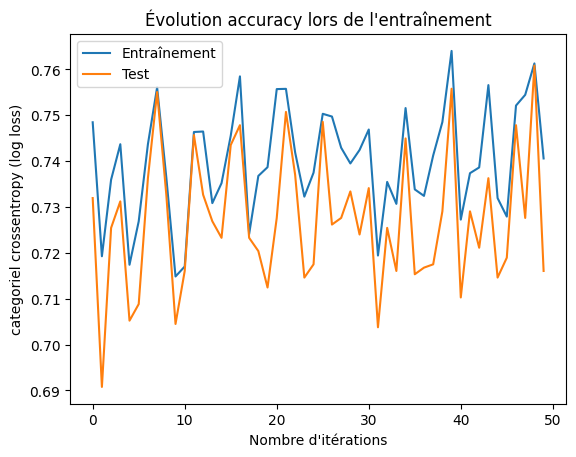

In [ ]:
model_svm = svm.SVC ( C= 0.01, kernel = 'linear'  )
num_iter = 50
train_batch_size = X_train.shape[0]//num_iter 
print ('train_batch_size ', train_batch_size)
validation_batch_size = X_validation.shape [0]//num_iter 
print ('test_batch_size ', validation_batch_size)
accuracy_train = []
accuracy_test = []
#log_loss_train = []
#log_loss_test = []
for i in range ( num_iter ):
    X_train_batch = X_train [ i*train_batch_size :  (i+1)*train_batch_size]
    y_train_batch = y_train [ i*train_batch_size :  (i+1)*train_batch_size  ]

    X_validation_batch = X_validation [ i*validation_batch_size : (i+1) * validation_batch_size ]
    y_validation_batch = y_validation [ i*validation_batch_size : (i+1) * validation_batch_size  ]

    model_svm.fit ( X_train_batch, y_train_batch)

    accuracy_train.append ( model_svm.score( X_train, y_train ) )
    accuracy_test.append ( model_svm.score ( X_validation, y_validation ) )

    #y_train_batch_pred = model_svm.predict_proba ( X_train_batch )
    #y_validation_batch_pred = model_svm.predict_proba ( X_validation_batch )

    #log_loss_train.append ( log_loss ( y_train_batch, y_train_batch_pred, labels = classes ) )
    #log_loss_test.append ( log_loss ( y_validation, y_validation_batch_pred, labels = classes ) )

    print ( 'Términé pour : ', (i+1)*train_batch_size ,'Entreprises')

# Tracer les courbes de log loss en fonction du nombre d'itérations
plt.plot(range(num_iter), accuracy_train, label='Entraînement')
plt.plot(range(num_iter), accuracy_test, label='Test')
plt.xlabel("Nombre d'itérations")
plt.ylabel("categoriel crossentropy (log loss)")
plt.title("Évolution accuracy lors de l'entraînement")
plt.legend()
plt.show()


In [ ]:
#Initialisation du model 
model_svm = svm.SVC ( C = 0.01, kernel = 'linear', probability = True )
model_svm.fit( X_train, y_train )

SVC(C=0.01, kernel='linear', probability=True)

|Performances du model|
----------------------

In [ ]:
#Faisant les prediction sur la data d'entrainnement
y_train_predicted = model_svm.predict ( X_train )
y_train_predicted

KeyboardInterrupt: 

In [ ]:
print (y_train)
print (y_train_predicted) 

8337      0
10396    16
3054      2
20608    31
20690     0
         ..
4757     33
2495     33
7266     30
17074     0
19626     0
Name: labels, Length: 19763, dtype: int64
[ 0 16  2 ... 30  0  0]


In [ ]:
#Calcule de l'accuracy sur la data d'entrainnement
print ( """ l'accuracy sur la data d'entrainnement """, accuracy_score ( y_train, y_train_predicted ) )

 l'accuracy sur la data d'entrainnement  0.9614431007438142


In [ ]:
#Faisons la prediction sur la data test
y_test_predicted = model_svm.predict ( X_test )

In [ ]:
print (y_test)
print ( y_test_predicted )

144      21
13638     0
6666      0
1805     16
6855     16
         ..
765       0
2682     33
17520    33
19135    22
9001     30
Name: labels, Length: 1488, dtype: int64
[21  0  0 ... 33 22 22]


In [ ]:
print ( """ l'accuracy sur la data test : """, accuracy_score ( y_test, y_test_predicted ) )

 l'accuracy sur la data test :  0.9153225806451613


In [ ]:
print ('Classification report \n', classification_report ( np.array (y_test), y_test_predicted ))

Classification report 
               precision    recall  f1-score   support

           0       0.92      0.95      0.94       410
           2       0.95      0.92      0.93        96
          16       0.90      0.92      0.91       298
          21       0.89      0.90      0.90        83
          22       0.90      1.00      0.95        43
          23       0.80      0.72      0.76        89
          30       0.94      0.89      0.92       110
          31       0.95      0.92      0.94       157
          32       1.00      0.91      0.95        11
          33       0.92      0.91      0.92       191

    accuracy                           0.92      1488
   macro avg       0.92      0.90      0.91      1488
weighted avg       0.92      0.92      0.91      1488



[Text(0, 0.5, '0'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '16'),
 Text(0, 3.5, '21'),
 Text(0, 4.5, '22'),
 Text(0, 5.5, '23'),
 Text(0, 6.5, '30'),
 Text(0, 7.5, '31'),
 Text(0, 8.5, '32'),
 Text(0, 9.5, '33')]

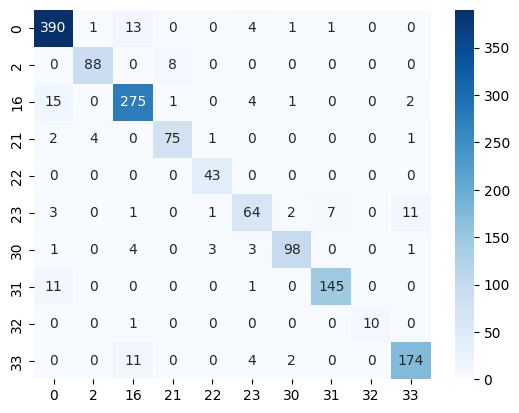

In [ ]:
#La matrice de confusion
labels = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
matrice_confusion = confusion_matrix ( y_test, y_test_predicted )
ax = sns.heatmap(matrice_confusion, annot=True, fmt="d", cmap="Blues")
ax.set_xticklabels(labels)
ax.set_yticklabels(labels)

f1 score ( average = 'micro' ) micore :
`Calculate metrics globally by counting the total true positives, false negatives and false positives.`

In [ ]:
#F1_score 
print ( 'f1_score macro sur données test = ', f1_score ( y_test, y_test_predicted, average = 'macro' )  ) 

f1_score macro sur données test =  0.9101020202277317


In [ ]:
#top 3 accuracy du modèle 
from top_accuracy_V0 import top_accuracy

classes = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
predictions = model_svm.predict_proba  (X_test)
print ( 'top 3 accuracy du modèle gradient descent = ', top_accuracy ( predictions, np.array (y_test), classes, top_i = 3 ) )

total =  1488
top 3  = 1487
top 3 accuracy du modèle gradient descent =  99.93279569892472


|Decision Buandries|
-------------------

Nous allons réduire les dimensions des données en deux dimensions à l'aide de la PCA, ensuite nous allons essayer de visualiser comment le model sépare les différents classes

In [ ]:
X_test

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
5055,-0.137931,-0.208955,0.986486,0.593470,-0.173364,-0.410419,9.060976,-0.197183,-0.133556,-0.129183,...,0,0,0,0,0,0,0,0,0,0
18675,0.137931,0.089552,-0.364865,0.574866,0.366246,0.102167,-0.456098,-0.197183,-0.129342,-0.137460,...,0,0,0,0,0,0,0,0,0,0
5808,1.034483,-0.597015,-1.000000,-0.148908,0.072331,0.211469,-0.098780,0.577465,0.697137,0.463476,...,0,0,0,0,0,0,0,0,0,0
9008,-0.413793,0.388060,0.567568,0.204975,-0.522388,-0.119935,-0.364634,0.633803,0.548612,0.753149,...,0,0,0,0,0,0,0,0,0,0
3822,0.948276,-0.298507,-0.148649,3.860256,0.497130,0.303136,-0.374390,0.169014,1.684494,1.205829,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20837,0.206897,0.000000,0.608108,-0.189378,-0.318025,-0.847220,-0.714634,3.704225,0.308676,-0.243613,...,0,0,0,0,0,0,0,0,0,0
14048,-0.172414,0.074627,-0.891892,-0.151669,0.988519,-0.458877,-0.610976,-0.901408,-0.061183,-0.111911,...,0,0,0,0,0,0,0,0,0,0
9746,-0.413793,0.656716,-0.567568,0.073435,-3.262916,-0.589581,-0.598780,-0.183099,-0.406918,-0.562073,...,0,0,0,0,0,0,0,0,0,0
16020,0.000000,-0.447761,3.256757,0.022678,0.060850,2.561448,2.263415,0.366197,-0.011626,0.112990,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
fig = px.scatter (x =  X_test['Sector'], y = X_test [ 'Net Debt / Equity (x) - Last'], color = y_test_predicted,  width = 700, height = 500 )
fig.show()

#### logistic Regression (a généré des mauvaise résultats)

|Initialisation du model|
-------------------

In [ ]:
#Search Grid
param_grid = { 
    'C' : [2, 0.1, 0.01 ],
    'max_iter' : [ 1000, 2000 ]
 }

grid_search = GridSearchCV (LogisticRegression(), param_grid, cv= 5)
grid_search.fit ( X_train, y_train )

c:\Users\hh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\hh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-

KeyboardInterrupt: 

In [ ]:
model = LogisticRegression( C=0.1, max_iter = 2000 )
num_iter = 50
train_batch_size = X_train.shape[0]//num_iter
print (train_batch_size)
validation_batch_size = X_validation.shape [0]//num_iter
print (validation_batch_size)
accuracy_train = []
accuracy_validation = []


for i in range (num_iter):
    X_train_batch = X_train[ i*train_batch_size: (i+1)*train_batch_size ]
    y_train_batch = y_train[ i*train_batch_size: (i+1)*train_batch_size ]

    X_validation_batch = X_validation[ i*validation_batch_size: (i+1)*validation_batch_size ]
    y_validation_batch = y_validation[ i*validation_batch_size: (i+1)*validation_batch_size ]

    model.fit ( X_train_batch, y_train_batch )

    accuracy_train.append ( model.score( X_train, y_train ) )
    accuracy_validation.append ( model.score( X_validation, y_validation ) )


    print ( 'Términé pour i :', i )

accuracy = pd.DataFrame({'num_iter': range (num_iter), 'accuracy_train': accuracy_train, 'accuracy_validation': accuracy_validation})
fig = px.line ( accuracy, x = 'num_iter', y = ['accuracy_train', 'accuracy_validation'], width = 700, height = 500 )
fig.update_layout ( title = '''accuracy en fct du nombre d'itération''' )
fig.show()


344
38


ValueError: The number of classes in labels is different from that in y_pred. Classes found in labels: [ 0  2 16 21 22 23 30 31 32 33]

In [ ]:
model_logistic_regression = LogisticRegression (C = 0.1 , max_iter = 2000)
model_logistic_regression.fit ( X_train, y_train )

c:\Users\hh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=0.1, max_iter=2000)

|Mesure des performances du model|
--------------------------

In [ ]:
#Prediction sur les données d'entrainnement
y_train_predicted = model_logistic_regression.predict (  X_train  )
print ( y_train )
print ( y_train_predicted )

8337      0
10396    16
3054      2
20608    31
20690     0
         ..
4757     33
2495     33
7266     30
17074     0
19626     0
Name: labels, Length: 19763, dtype: int64
[ 0 16  2 ... 30  0  0]


In [ ]:
#Accuracy score sur les données d'entrainnement
print ( '''Accuracy score sur les données d'entrainnement ''', accuracy_score (y_train, y_train_predicted))

Accuracy score sur les données d'entrainnement  0.7928452158073167


In [ ]:
#Prediction sur les données test
y_test_predicted = model_logistic_regression.predict ( X_test )
print ( y_test )
print ( y_test_predicted )

144      21
13638     0
6666      0
1805     16
6855     16
         ..
765       0
2682     33
17520    33
19135    22
9001     30
Name: labels, Length: 1488, dtype: int64
[21  0  0 ... 33 22 30]


In [ ]:
#Accuracy score sur les données test
print ( '''Accuracy score sur les données test ''', accuracy_score (y_test, y_test_predicted))

Accuracy score sur les données test  0.6384408602150538


In [ ]:
print ( 'F1 score macro sur les données test :', f1_score ( y_test, y_test_predicted, average = 'macro' ) )

F1 score macro sur les données test : 0.7041412525967763


In [ ]:
#top 3 accuracy du modèle 
from top_accuracy_V0 import top_accuracy

predictions = model_logistic_regression.predict_proba  (X_test)
print ( 'top 3 accuracy du modèle gradient descent = ', top_accuracy ( predictions, np.array (y_test), classes, top_i = 3 ) )

total =  1488
top 3  = 1418
top 3 accuracy du modèle gradient descent =  95.29569892473118


#### Descision Tree

In [ ]:
X_train

,Country,Sector,Net Debt / Equity (x) - Last,Net Sales - Last,ROA - Last,Sales To Assets (%) - Last,Sales To Receiv. - Last,Net Debt / Equity (x) - Last.1,Fin. Debt / Equity (%) - 2020,Fin. Debt / Assets (%) - 2020,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
17860,0.137931,0.611940,0.905405,0.633030,-0.198622,-0.803877,4.523171,-0.732394,-0.254469,-0.394746,...,0,0,0,0,0,0,0,0,0,0
17709,0.103448,-0.223881,0.229730,0.148826,1.422503,5.256158,9.241463,0.436620,2.767621,0.610291,...,0,0,0,0,0,0,0,0,0,0
1905,0.775862,0.716418,-0.054054,-0.182322,-5.105626,-0.486203,6.009756,0.971831,0.776341,0.607773,...,0,1,0,0,0,0,0,0,0,0
1333,0.741379,0.089552,0.283784,0.613550,0.885189,0.373805,-0.070732,0.563380,0.090394,-0.034905,...,0,0,0,0,0,0,0,0,0,0
12587,-0.413793,0.417910,-0.202703,-0.007324,0.461538,0.078072,-0.068293,0.380282,0.508938,0.648435,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21527,0.465517,0.656716,-0.148649,-0.165189,1.799082,-0.136088,0.578049,-0.281690,2.082837,0.820439,...,1,0,0,0,0,0,0,0,0,0
9842,-0.413793,0.656716,-0.148649,-0.183089,-2.207807,0.114820,-0.591463,-0.070423,-0.213486,-0.210507,...,0,0,0,0,0,0,0,0,0,0
15335,0.000000,-0.492537,1.405405,6.377626,0.508611,-0.407996,0.665854,-0.436620,-0.306060,-0.385390,...,0,0,0,0,0,0,0,0,0,0
14152,-0.172414,0.253731,0.351351,106.740171,0.094145,-0.302733,0.468293,2.112676,1.190234,0.602015,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Search Grid
param_grid = { 'min_samples_leaf' : [ 2, 3, 4, 5, 6, 7] }

search_grid = GridSearchCV ( DecisionTreeClassifier(), param_grid, cv = 5 )
search_grid.fit ( X_train, y_train )
print ( 'La meilleure valeur du max_depth est : ',  search_grid.best_params_)

La meilleure valeur du max_depth est :  {'min_samples_leaf': 6}


In [ ]:
#Entrainnement par batches
labels= [ 0,  2, 16, 21, 22, 23, 30, 31, 32, 33,]
model_decision_tree = DecisionTreeClassifier ( criterion = 'gini', max_depth = 22, min_samples_leaf = 5 )
num_iter = 49
train_batch_size = X_train.shape[0]//num_iter 
print ('train_batch_size ', train_batch_size)
validation_batch_size = X_validation.shape [0]//num_iter 
print ('test_batch_size ', validation_batch_size)
#accuracy_train = []
#accuracy_test = []
log_loss_train = []
log_loss_validation = []
for i in range ( num_iter ):
    X_train_batch = X_train [ i*train_batch_size :  (i+1)*train_batch_size]
    y_train_batch = y_train [ i*train_batch_size :  (i+1)*train_batch_size  ]

    X_validation_batch = X_validation [ i*validation_batch_size : (i+1) * validation_batch_size ]
    y_validation_batch = y_validation [ i*validation_batch_size : (i+1) * validation_batch_size  ]

    model_decision_tree.fit ( X_train_batch, y_train_batch)

    #accuracy_train.append ( model_decision_tree.score( X_train, y_train ) )
    #accuracy_test.append ( model_decision_tree.score ( X_validation, y_validation ) )

    y_train_pred = model_decision_tree.predict_proba ( X_train )
    y_validation_pred = model_decision_tree.predict_proba ( X_validation )

    log_loss_train.append ( log_loss ( y_train, y_train_pred, labels = labels ) )
    log_loss_validation.append ( log_loss ( y_validation, y_validation_pred, labels = labels ) )

    print ( 'Términé pour : ', (i+1)*train_batch_size ,'Entreprises')


log_loss_df = pd.DataFrame({'num_iter': range (num_iter), 'log_loss_train': log_loss_train, 'log_loss_validation': log_loss_validation})
fig = px.line ( log_loss_df, x = 'num_iter', y = ['log_loss_train', 'log_loss_validation'], width = 700, height = 500 )
fig.update_layout ( title = '''log_loss en fct du nombre d'itération''' )
fig.show()


train_batch_size  375
test_batch_size  28
Términé pour :  375 Entreprises
Términé pour :  750 Entreprises
Términé pour :  1125 Entreprises
Términé pour :  1500 Entreprises
Términé pour :  1875 Entreprises
Términé pour :  2250 Entreprises
Términé pour :  2625 Entreprises
Términé pour :  3000 Entreprises
Términé pour :  3375 Entreprises
Términé pour :  3750 Entreprises
Términé pour :  4125 Entreprises
Términé pour :  4500 Entreprises
Términé pour :  4875 Entreprises
Términé pour :  5250 Entreprises
Términé pour :  5625 Entreprises
Términé pour :  6000 Entreprises
Términé pour :  6375 Entreprises
Términé pour :  6750 Entreprises
Términé pour :  7125 Entreprises
Términé pour :  7500 Entreprises
Términé pour :  7875 Entreprises
Términé pour :  8250 Entreprises
Términé pour :  8625 Entreprises
Términé pour :  9000 Entreprises
Términé pour :  9375 Entreprises
Términé pour :  9750 Entreprises
Términé pour :  10125 Entreprises
Términé pour :  10500 Entreprises
Términé pour :  10875 Entreprises


|Initialisation du model|
------------------------

In [ ]:
#Initialisaiton et entrainnement du model du model
model_decision_tree = DecisionTreeClassifier ( criterion = 'gini', min_samples_leaf = 5)
model_decision_tree.fit ( X_train, y_train )

DecisionTreeClassifier(min_samples_leaf=5)

In [ ]:
y_train_predicted = model_decision_tree.predict ( X_train )
print ( 'y_train ', y_train )
print ( 'X_train_predicted ', y_train_predicted )

y_train  8337      0
10396    16
3054      2
20608    31
20690     0
         ..
4757     33
2495     33
7266     30
17074     0
19626     0
Name: labels, Length: 19763, dtype: int64
X_train_predicted  [ 0 16  2 ... 30  0  0]


In [ ]:
#Log loss sur les données d'entrainnement
y_train_predicted_proba = model_decision_tree.predict_proba ( X_train )
print ( 'log loss sur les données dentrainnement :', log_loss(y_train, y_train_predicted_proba,  labels= [ 0,  2, 16, 21, 22, 23, 30, 31, 32, 33,]))

log loss sur les données dentrainnement : 0.13911790349333183


In [ ]:
#Accuracy sur les données d'entrainnement 
print ( ''' Accuracy sur les données d'entrainnement ''', accuracy_score ( y_train, y_train_predicted )  )

 Accuracy sur les données d'entrainnement  0.9332591205788595


[Text(0, 0.5, '0'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '16'),
 Text(0, 3.5, '21'),
 Text(0, 4.5, '22'),
 Text(0, 5.5, '23'),
 Text(0, 6.5, '30'),
 Text(0, 7.5, '31'),
 Text(0, 8.5, '32'),
 Text(0, 9.5, '33')]

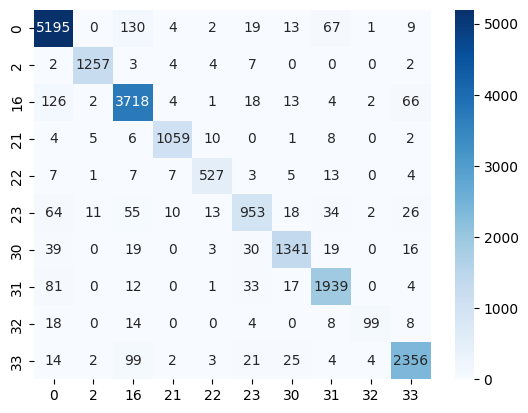

In [ ]:
#Matrice de confusion sur les données d'entrainnement
labels = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
matrice_confusion_train = confusion_matrix (y_train, y_train_predicted)
fig2 = sns.heatmap ( matrice_confusion_train, annot = True, fmt = 'd', cmap = 'Blues' )
fig2.set_xticklabels (labels)
fig2.set_yticklabels (labels)

In [ ]:
y_test_predicted = model_decision_tree.predict ( X_test )
print ( 'y_test ', y_test )
print ( 'y_test_predicted ', y_test_predicted )

y_test  144      21
13638     0
6666      0
1805     16
6855     16
         ..
765       0
2682     33
17520    33
19135    22
9001     30
Name: labels, Length: 1488, dtype: int64
y_test_predicted  [21  0  0 ... 33 22 30]


In [ ]:
#Log loss sut les données test
y_test_predicted_proba = model_decision_tree.predict_proba ( X_test )
print ( 'log loss sur les données test :', log_loss(y_test, y_test_predicted_proba,  labels= [ 0,  2, 16, 21, 22, 23, 30, 31, 32, 33,]))

log loss sur les données test : 3.8948804042564475


In [ ]:
#Accuracy sur les données test
print ( 'Accuracy sur les données test : ', accuracy_score ( y_test, y_test_predicted ) )

Accuracy sur les données test :  0.8380376344086021


Text(50.722222222222214, 0.5, 'True lables')

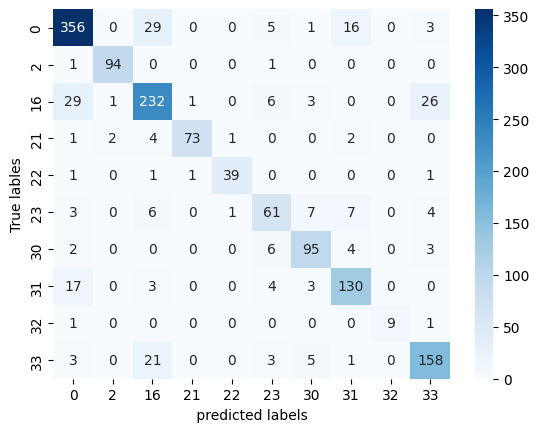

In [ ]:
#Matrice de confusion
#Sue l'axe des coordonnées les True labels
#Sur l'axe des abcisses les labels predicted
labels = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
matrice_confusion = confusion_matrix ( y_test, y_test_predicted )
fig = sns.heatmap ( matrice_confusion, annot = True, fmt = 'd', cmap = 'Blues' )
fig.set_xticklabels (labels)
fig.set_yticklabels (labels)
fig.set_xlabel (' predicted labels ')
fig.set_ylabel ( 'True lables' )

In [ ]:
print ( 'F1-score sur datatest : ', f1_score ( y_test, y_test_predicted, average = 'macro' )  )

F1-score sur datatest :  0.8554021661784571


In [ ]:
proba_predictions = model_decision_tree.predict_proba (X_test )
proba_predictions

array([[0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.66666667, 0.        , 0.        , ..., 0.11111111, 0.11111111,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.4       ],
       ...,
       [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
#Top 3 accuracy du model
from top_accuracy_V0 import top_accuracy

In [ ]:
classes = [ 0, 2, 16, 21, 22, 23, 30, 31, 32, 33 ]
print ( 'Top 3 accuracy du model decision tree :',  top_accuracy ( proba_predictions, np.array (y_test), classes, top_i = 3 ))

total =  1488
top 3  = 1387
Top 3 accuracy du model decision tree 93.21236559139786


|Visualisation de l'arbre de decision|
----------------------------------

In [ ]:
#Profondeur de l'arbre 
print ( '''profondeur de l'arbre : ''', model_decision_tree.tree_.max_depth )

profondeur de l'arbre :  37


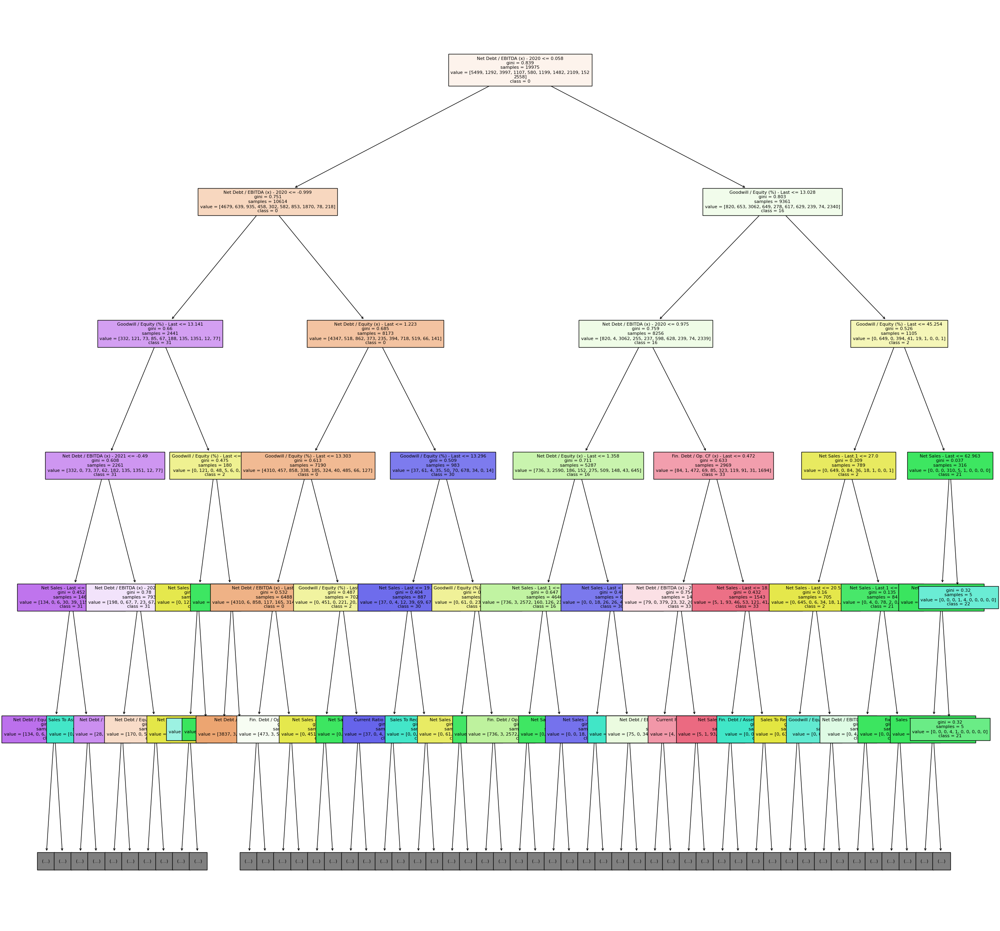

In [ ]:
plt.figure(figsize=(30, 30))
plot_tree(model_decision_tree , feature_names=list(map(str, X_train.columns)), class_names=list(map(str, labels)), filled=True, max_depth = 5,  fontsize= 8)
plt.savefig ( 'Data Finpack/Decision_Tree.png' )

<Figure size 640x480 with 0 Axes>

#### Random Forest 

In [ ]:
#Search Grid
param_grid = { 'max_depth' : [49, 40, 41] }      
search_grid = GridSearchCV ( RandomForestClassifier (n_estimators = 200, criterion = 'gini', min_samples_leaf = 2), param_grid, cv = 5 )     
search_grid.fit ( X_train, y_train )
print ( 'Les meilleur paramètres :', search_grid.best_params_ )

Les meilleur paramètres : {'max_depth': 49}


In [ ]:
#Visualisation de l'evolution de l'accuracy en fonction du max depht
min_samples_leaf_list = range ( 1, 11 )
accuracy = []
for i in min_samples_leaf_list:
    model = RandomForestClassifier ( n_estimators = 200, criterion = 'gini', max_depth = 43, min_samples_leaf = i )
    model.fit ( X_train, y_train )
    y_predicted = model.predict ( X_test )
    accuracy.append ( accuracy_score ( y_test, y_predicted ) )
    print (  'Terminé pour min_samples_leaf = ', i  )

fig12 = px.line ( x = range( 1, 10), y = accuracy, width = 700, height = 500  )
fig12.update_layout  ( title = 'Evolution de accuracy en fonction du max depth ' ) 
fig12.show()  

Terminé pour min_samples_leaf =  1
Terminé pour min_samples_leaf =  2
Terminé pour min_samples_leaf =  3
Terminé pour min_samples_leaf =  4
Terminé pour min_samples_leaf =  5
Terminé pour min_samples_leaf =  6
Terminé pour min_samples_leaf =  7
Terminé pour min_samples_leaf =  8
Terminé pour min_samples_leaf =  9
Terminé pour min_samples_leaf =  10


ValueError: All arguments should have the same length. The length of argument `y` is 10, whereas the length of  previously-processed arguments ['x'] is 21

In [ ]:
fig12 = px.line ( x = range( 1, 11 ), y = accuracy, width = 700, height = 500  )
fig12.update_layout  ( title = 'Evolution de accuracy en fonction du max depth ' ) 
fig12.show()  

In [ ]:
#Initialisation du model
model_random_forest = RandomForestClassifier( n_estimators = 100,  criterion = 'gini', max_depth = 43, min_samples_leaf =2 )
model_random_forest.fit ( X_train, y_train )

RandomForestClassifier(max_depth=43, min_samples_leaf=2)

In [ ]:
y_train_predicted = model_random_forest.predict ( X_train )
print ('y_train : \n', y_train )
print ( 'y_train_predicted : \n', y_train_predicted )

y_train : 
 8337      0
10396    16
3054      2
20608    31
20690     0
         ..
4757     33
2495     33
7266     30
17074     0
19626     0
Name: labels, Length: 19763, dtype: int64
y_train_predicted : 
 [ 0 16  2 ... 30  0  0]


In [ ]:
print ( '''accuracy score sur les données d'entrainnement ''', accuracy_score ( y_train, y_train_predicted ) )

accuracy score sur les données d'entrainnement  0.9880078935384304


In [ ]:
y_test_predicted = model_random_forest.predict ( X_test )
print ('y_train : \n', y_test )
print ( 'y_train_predicted :\n ', y_test_predicted )

y_train : 
 144      21
13638     0
6666      0
1805     16
6855     16
         ..
765       0
2682     33
17520    33
19135    22
9001     30
Name: labels, Length: 1488, dtype: int64
y_train_predicted :
  [ 2  0  0 ... 33 22 30]


In [ ]:
print ( '''accuracy score sur les données test ''', accuracy_score ( y_test, y_test_predicted ) )

accuracy score sur les données test  0.6881720430107527


[Text(0, 0.5, '0'),
 Text(0, 1.5, '2'),
 Text(0, 2.5, '16'),
 Text(0, 3.5, '21'),
 Text(0, 4.5, '22'),
 Text(0, 5.5, '23'),
 Text(0, 6.5, '30'),
 Text(0, 7.5, '31'),
 Text(0, 8.5, '32'),
 Text(0, 9.5, '33')]

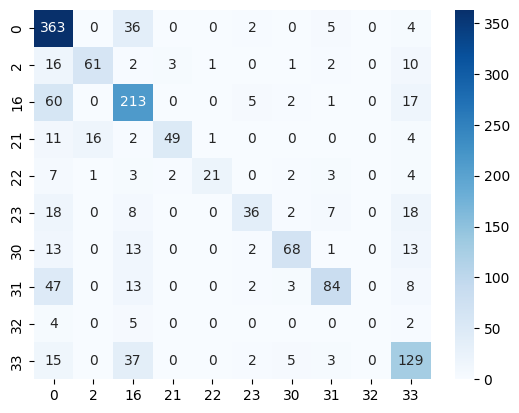

In [ ]:
#Matrice de confusion sur les données test
classes = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
matrice_confusion = confusion_matrix ( y_test, y_test_predicted )
fig = sns.heatmap ( matrice_confusion, annot = True, fmt = 'd', cmap = 'Blues' )
fig.set_xticklabels (classes)
fig.set_yticklabels (classes)

In [ ]:
print ( 'F1_score du model Random Forest sur les données test :', f1_score( y_test, y_test_predicted, average = 'macro' ) )

F1_score du model Random Forest sur les données test : 0.5992329651021768


In [ ]:
#top 3 accuracy du modèle 
from top_accuracy_V0 import top_accuracy

predictions = model_random_forest.predict_proba  (X_test)
print ( 'top 3 accuracy du modèle gradient descent = ', top_accuracy ( predictions, np.array (y_test), classes, top_i = 3 ) )

total =  1488
top 3  = 1428
top 3 accuracy du modèle gradient descent =  95.96774193548387


#### K-Nearest Neighbors

|Choix de l'heperparamère n_neighbors|
-----------------------------

In [ ]:
#Cherchons la meilleur valeur pour n_neighbors
n_neighbors_list = range (20, 30)
#accuracy_train = []
#accuracy_test = []
for n_neighbors in n_neighbors_list:
    model = KNeighborsClassifier ( n_neighbors )
    model.fit ( X_train, y_train )
    y_train_predicted = model.predict ( X_train )
    y_test_predicted = model.predict ( X_test )
    accuracy_train.append (accuracy_score ( y_train, y_train_predicted ))
    accuracy_test.append ( accuracy_score ( y_test, y_test_predicted ) )
    print ( 'Términé pour n_neighbors = ', n_neighbors)

accuracy = pd.DataFrame( {'n_neighbors' : range(1, len(accuracy_train)+1), 'accuracy_train' : accuracy_train, 'accuracy_test' : accuracy_test} )
fig13 = px.line (accuracy,  x ='n_neighbors', y = ['accuracy_train','accuracy_test'], width = 700, height = 500  )
fig13.update_layout ( title = 'evolution de accuracy en fonction de n_neighbors' )
fig13.show()


Términé pour n_neighbors =  20
Términé pour n_neighbors =  21
Términé pour n_neighbors =  22
Términé pour n_neighbors =  23
Términé pour n_neighbors =  24
Términé pour n_neighbors =  25
Términé pour n_neighbors =  26
Términé pour n_neighbors =  27
Términé pour n_neighbors =  28
Términé pour n_neighbors =  29


|Initialisation du model|
------------------------

In [ ]:
#Initialisation du model
n_neighbors = 23
model_kneighbors = KNeighborsClassifier ( n_neighbors )
model_kneighbors.fit ( X_train, y_train )

KNeighborsClassifier(n_neighbors=23)

|Perfomances du model|
----------------------------

In [ ]:
y_train_predicted = model_kneighbors.predict ( X_train )
print ('y_train : \n', y_train )
print ( 'y_train_predicted : \n', y_train_predicted )

y_train : 
 8337      0
10396    16
3054      2
20608    31
20690     0
         ..
4757     33
2495     33
7266     30
17074     0
19626     0
Name: labels, Length: 19763, dtype: int64
y_train_predicted : 
 [ 0  0  2 ... 16  0  0]


In [ ]:
print ( '''accuracy score du model KNN sur les données d'entrainnement ''', accuracy_score ( y_train, y_train_predicted ) )

accuracy score du model KNN sur les données d'entrainnement  0.7590952790568234


In [ ]:
y_test_predicted = model_kneighbors.predict ( X_test )
print ('y_test : \n', y_test )
print ( 'y_test_predicted :\n ', y_test_predicted )

y_test : 
 144      21
13638     0
6666      0
1805     16
6855     16
         ..
765       0
2682     33
17520    33
19135    22
9001     30
Name: labels, Length: 1488, dtype: int64
y_test_predicted :
  [21  0  0 ... 33 22 16]


In [ ]:
print ( '''accuracy score du model KNN sur les données test ''', accuracy_score ( y_test, y_test_predicted ) )

accuracy score du model KNN sur les données test  0.7298387096774194


Text(50.722222222222214, 0.5, 'True labels')

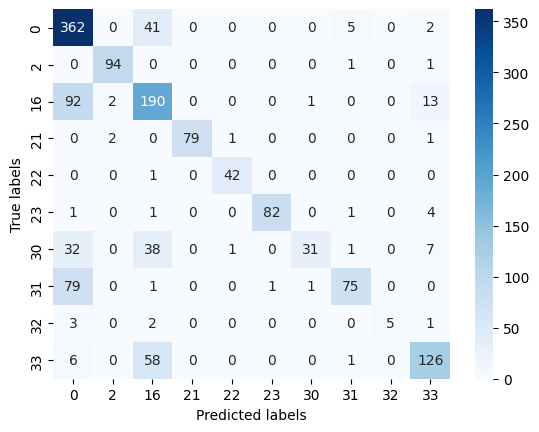

In [ ]:
#Matrice de confusion sur les données d'entrainnement 
classes = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
matrice_confusion = confusion_matrix ( y_test, y_test_predicted )
fig15 =  sns.heatmap ( matrice_confusion, annot  = True, fmt = 'd', cmap = 'Blues' )
fig15.set_xticklabels ( classes )
fig15.set_yticklabels ( classes )
fig15.set_xlabel ( 'Predicted labels' )
fig15.set_ylabel ( 'True labels' )

In [ ]:
print ( 'F1_score macro sur les données test :', f1_score ( y_test, y_test_predicted, average = "macro" ) )

F1_score macro sur les données test : 0.7610883176273907


|Top 3 accuracy score |
--------------------

In [ ]:
#Definons la fonction top_3_accuracy d'un module 
#la fonction top_3_accuracy ( prediction, true_labels )  return la valeur du top3 accuracy
def top_3_accuracy ( predictions, true_labels):
    top3 = 0
    #Nombre de predict
    total = len ( predictions )
    print ( 'total = ', total )
    #Les classes
    classes = [0, 2, 16, 21, 22, 23, 30, 31, 32, 33]
    for i in range ( total ):
        #la prediction i
        prediction = predictions [i]  #(1, 10)
        #le label i
        label = true_labels [i]       #(1, 1)
        
        #Transformons prediction en une dataframe d'index classes
        prediction_df = pd.DataFrame ( {'prediction' : prediction}, index = classes )
        #Trions les probabilités de la prediction i par ordre décroissant
        prediction_sorted = prediction_df.sort_values( 'prediction', ascending = False )


        #Si le label est présent dans les premières 3 probabilités ajouter 1 dans top3
        if label in prediction_sorted[:3].index:
            top3 += 1 
    print ( 'top3 =', top3 )
    return (top3/total)*100



In [ ]:
#top3 accuracy du model
predictions = model_kneighbors.predict_proba ( X_test )
predictions


array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.86956522, 0.        , 0.        , ..., 0.13043478, 0.        ,
        0.        ],
       [0.60869565, 0.        , 0.2173913 , ..., 0.04347826, 0.        ,
        0.        ],
       ...,
       [0.47826087, 0.        , 0.34782609, ..., 0.13043478, 0.        ,
        0.        ],
       [0.        , 0.17391304, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.56521739, 0.        , 0.        , ..., 0.08695652, 0.        ,
        0.        ]])

In [ ]:
print (' top 3 accuracy score du model KNN =  ', top_accuracy ( predictions, np.array( y_test ), classes, top_i = 3 ))

total =  638
top 3  = 632
 top 3 accuracy score du model KNN =   99.05956112852664


In [ ]:
#top 3 accuracy du modèle 
from top_accuracy_V0 import top_accuracy

predictions = model_kneighbors.predict_proba  (X_test)
print ( 'top 3 accuracy du modèle gradient descent = ', top_accuracy ( predictions, np.array (y_test), classes, top_i = 3 ) )

total =  1488
top 3  = 1454
top 3 accuracy du modèle gradient descent =  97.71505376344086


### Calcule de la silhouette du clustering final

In [18]:
data = pd.read_excel ( 'Data Finpack V2/Entreprise_classe_V2.xlsx', index_col = 0 )
data = pd.merge ( data, description_0_21409_coder, right_index = True, left_index = True )
data 

,Efcode,Company Name,Sector_Original,Country_Original,Sector,Country,EBITDA - Last,EBITDA Marg. (%) - Last,labels,business,...,operational,manage,achieved,insights,vitro,machineries,thousand,pfts,intelligent,dairy
9807,40838FC,Amulaire Thermal Technology Inc.,Heavy Construction,TWN,0.000000,1.000000,-0.312810,-2.180109,0,1,...,0,0,0,0,0,0,0,0,0,0
9836,30071FC,Hocheng Corporation,Building Materials & Fixtures,TWN,-0.611940,1.000000,0.187261,-0.129776,0,1,...,0,0,0,0,0,0,0,0,0,0
9856,30823FC,Longda Construction & Development Corp.,Heavy Construction,TWN,0.000000,1.000000,0.699601,0.718617,0,1,...,0,0,0,0,0,0,0,0,0,0
9885,30768FC,"Tung Kai Technology Engineering Co., Ltd.",Heavy Construction,TWN,0.000000,1.000000,-0.213853,-0.864767,0,1,...,0,0,0,0,0,0,0,0,0,0
9941,30209FC,Apex Science & Engineering Corp.,Electronic Equipment,TWN,-0.268657,1.000000,0.079980,-0.035779,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83437,30345EN,Intertrust NV,Specialty Finance,NLD,0.716418,0.535714,5.137368,1.345664,13,1,...,0,0,1,0,0,0,0,0,0,0
83524,90006EN,Royal BAM Groep NV,Heavy Construction,NLD,0.000000,0.535714,9.108747,-0.335961,13,1,...,1,0,0,0,0,0,0,0,0,0
83525,90032EN,Royal Boskalis Westminster N.V.,Heavy Construction,NLD,0.000000,0.535714,12.823483,0.290479,13,1,...,0,0,0,0,0,0,0,0,0,0
83573,30261EN,Yandex NV,Internet,NLD,0.149254,0.535714,15.010615,-0.155246,13,1,...,0,0,0,0,0,0,0,0,1,0


In [22]:
list = ['Efcode', 'Company Name', 'Sector_Original', 'Country_Original', 'labels']
print ( 'la silhouette score du clustering final =', silhouette_score ( data.drop (list, axis =1), data.labels ) )

la silhouette score du clustering final = -0.07004058425480007
